## Create Image Dataset (x_in)

In [3]:
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow import keras
#import tensorflow_datasets as tfds
import os
import cv2
import time

In [4]:
# Image Dataset
#PARAMETERS

#Ruta_ds = "C:\\Users\\kikan\\Dropbox\\Mi PC (LAPTOP-5OQE9PI0)\\Pictures\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\*"
Ruta_ds = "C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\*"
#Ruta_tmp = "C:\\Users\\kikan\\Dropbox\\Mi PC (LAPTOP-5OQE9PI0)\\Pictures\\Hayward-Kiwi-RGB-NIR-D-master\\tmp\\*"
s=""
numImgs = 20
dispImg = min(5, numImgs)
OrgHigh = 512
OrgWith = 424
imsize = 800
val_split = 0.2
ImgLossF = numImgs*(1-val_split)
print(ImgLossF)

16.0


In [5]:
print(np.__version__)
print(tf.__version__)
print(cv2.__version__)
#print(os.__version__)
#print(plt.__version__)

1.26.4
2.17.0
4.10.0


In [9]:


image_ds = tf.data.Dataset.list_files(Ruta_ds, shuffle = False)
image_ds = image_ds.shuffle(500, reshuffle_each_iteration=False)
#image_ds10 = tf.data.Dataset.list_files(Ruta_ds, shuffle = False)
#image_ds10 = tf.data.Dataset.from_tensor_slices(image_ds.take(10))
#image_ds10 =image_ds.take(10).shuffle(1, reshuffle_each_iteration=False)
#image_ds10 = image_ds10.shuffle(500, reshuffle_each_iteration=False)
#image_ds10np = [0]
#for image in image_ds10:
#    print(image.numpy())
#image_ds10.save(Ruta_tmp)
#new_dataset = tf.data.Dataset.load(Ruta_tmp)
#print("-------------------------------")
#image_ds10 = image_ds.take(10).shuffle(1, reshuffle_each_iteration=False)
#for imageNP in image_ds10:
#    print(imageNP.numpy())

In [11]:
image_count = len(image_ds)
image_count

450

In [13]:
#train_num = int(image_count*0.02)+1
train_num = int(numImgs)
image_ds.shuffle(train_num, reshuffle_each_iteration=False)
train_ds = image_ds.take(train_num)
#train_ds = image_ds10.shuffle(1, reshuffle_each_iteration=False)
#train_ds = train_ds.shuffle(500, reshuffle_each_iteration=False)
#train_ds.shuffle(10, reshuffle_each_iteration=False)
print(len(train_ds))
for image in train_ds:
    print(image.numpy())

20
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000041.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000241.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000308.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000419.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000387.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000186.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000132.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000331.png'
b'C:\\Users\\

In [15]:
#test_num = int(image_count*0.98)
test_num = int(image_count - numImgs)
print("test_num: ",test_num)
#test_ds = image_ds.shuffle(image_count, reshuffle_each_iteration=True)
test_ds = image_ds.skip(test_num)
#test_ds = image_ds.take(test_num)
print(len(test_ds))
for image in test_ds:
    print(image.numpy())

test_num:  430
20
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000448.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000179.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000233.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000021.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000100.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000097.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000273.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000255.png

In [17]:
# Funcion que resize la imagen, y los pixeles quedan entre 0 y 1

def image_process(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img, channels=3)
    img = img/255
    img = tf.image.resize(img, [imsize,imsize])
    imgSzXY = img.shape
    img_np = img.numpy()
    return img_np, imgSzXY

In [19]:
for t in train_ds: #.shuffle(1, reshuffle_each_iteration=False):#.take(10):
    print(t.numpy())

b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000041.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000241.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000308.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000419.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000387.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000186.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000132.png'
b'C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\02_imagenes_Kiwis\\Hayward-Kiwi-RGB-NIR-D-master\\todas\\000331.png'
b'C:\\Users\\kik

In [21]:
#Image Train and test Datasets
#import numpy

ImgList = []
tr_ds = []
#Train Dataset in Numpy
l_tr=len(train_ds)
print(l_tr)
for tpath in train_ds:#.take(l_tr): # path of sample
    train_Path = tpath.numpy()
    tp = train_Path.decode("utf-8")
    print(tp)
    
    #read image(tf)
    Img, tr_ImgShp = image_process(tp)
    ImgList.append(Img)
    print(tr_ImgShp)

#Convert list to numpy
tr_ds = np.array(ImgList)
    
ImgList = []
ts_ds = []
#Test Dataset in Numpy
l_ts=len(test_ds)
print(l_ts)
for tpath in test_ds:#.take(l_ts): # path of sample
    test_Path = tpath.numpy()
    print(tpath)
    
    #read image(tf)
    Img, ts_ImgShp = image_process(test_Path)
    ImgList.append(Img)
    print(ts_ImgShp)


#Convert list to numpy
ts_ds = np.array(ImgList)

#Convert dataset to numpy
#np_tr = tf.data.Dataset.as_numpy(tr_ds)

print(tr_ds.shape)
print(ts_ds.shape)
print(type(tr_ds))
print(type(ts_ds))

print("tr_ds: ",tr_ds[0,400,:,:])


20
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000041.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000241.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000308.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000419.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000387.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000186.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000132.png
(800, 800, 3)
C:\Users\kikan\Dropbox\Ing\2022\03_Frt_recog\02_imagenes_Kiwis\Hayward-Kiwi-RGB-NIR-D-master\todas\000331.png
(800, 800, 3)
C:\Us

## Create Bounding Boxes ground true in a batchxSxSx5 matriz (Y_ref)

In [23]:
from tensorflow.keras.applications import VGG16
from keras.callbacks import ModelCheckpoint, EarlyStopping

from keras.applications.vgg16 import VGG16
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input
from keras.layers import Input, Flatten, Dense, GlobalAveragePooling2D, Reshape
from keras.models import Model

import os # para path en Windows

import pandas as pd # para uso de archivo CSV y tablas tipo Excel


In [26]:
# Bbox GT 
# PARAMETERS
# --------------
rutaCSV = "C:\\Users\\kikan\\Dropbox\\Ing\\2022\\03_Frt_recog\\04_Code\\"

imgKiwiDF = pd.read_csv(rutaCSV + 'imgKiwiFileNames2CSV.csv', sep=';') #tabla tipo panda's Datraframe
imgNoKiwiDF = pd.read_csv(rutaCSV + 'imgNoKiwiFileNames2CSV.csv', sep=';') #tabla tipo panda's Datraframe

S = 25 

In [28]:
# Get File name for Training Dataset
strPath = b""
FileName = []
FileNameLst_tr = []
i = 0
for tpath in train_ds: #.take(n): # path of sample p in PathLst: # path of sample
    #strPath= samplePath.decode() # convert byte-type path to string-type path
    tpathNP = tpath.numpy()
    strPath = tpathNP.decode("utf-8")
    #print(tpath)
    #print(strPath)
    FileName = strPath.split("\\")[-1] # extract sample file name
    FileNameLst_tr.append(FileName)
    i = i+1
FileNameLst_tr

['000041.png',
 '000241.png',
 '000308.png',
 '000419.png',
 '000387.png',
 '000186.png',
 '000132.png',
 '000331.png',
 '000026.png',
 '000246.png',
 '000118.png',
 '000257.png',
 '000420.png',
 '000330.png',
 '000031.png',
 '000193.png',
 '000038.png',
 '000154.png',
 '000224.png',
 '000392.png']

In [30]:
# Get File name for Test Dataset
strPath = b""
FileName = []
FileNameLst_ts = []
i = 0
for tpath in test_ds: #.take(n): # path of sample p in PathLst: # path of sample
    #strPath= samplePath.decode() # convert byte-type path to string-type path
    tpathNP = tpath.numpy()
    strPath = tpathNP.decode("utf-8")
    FileName = strPath.split("\\")[-1] # extract sample file name
    FileNameLst_ts.append(FileName)
    i = i+1
FileNameLst_ts

['000448.png',
 '000179.png',
 '000233.png',
 '000021.png',
 '000100.png',
 '000097.png',
 '000273.png',
 '000255.png',
 '000433.png',
 '000062.png',
 '000341.png',
 '000216.png',
 '000197.png',
 '000156.png',
 '000141.png',
 '000398.png',
 '000261.png',
 '000214.png',
 '000400.png',
 '000309.png']

In [32]:
# selecting rows based on column condition (File Name) for Training Dataset
#-------------------------------------------------------------------------

bb_tr_lst = []
i=0

# Arreglo np iniciado en zeros para el num de bbox por cada imagen del training
tr_len = np.zeros(len(FileNameLst_tr),dtype=int) #FileNameLst_tr: Lista de nombre de archivos XXX.png para Tr.
print(tr_len)

bbmax = 0
for s in FileNameLst_tr:
    print(FileNameLst_tr[i])
    options = [s]

    # Se eligen todas las filas que tengan el nombre del archivo en la columna de la tabla (DF) = s
    filterImg_df = imgKiwiDF[imgKiwiDF['Var1_7'].isin(options)] # Var1_7 = name of image file: Ej: 000021.png
    #filterImgNo_df = imgNoKiwiDF[imgNoKiwiDF['Var1_7'].isin(options)]
    
    #Se extraen de la tabla filtrada las cuatro columnas con las coordenadas de todos los BBox de la imagen=s
    bbox_df = filterImg_df.iloc[:,1:5]  # Col 1,2,3,4: Coord de Bounding Baxes (bbox) with Kiwis
    tr_len[i] = len(bbox_df) #num of bboxes with Kiwi
    #bboxNo_df_tmp = filterImgNo_df.iloc[:,1:5]
    #nklen = len(bboxNo_df_tmp) #num of bboxes without Kiwi

    # to concat two dataframes
    #bbox_df= bbox_df_tmp.append(bboxNo_df_tmp)
    #bbox_df = pd.concat([bbox_df_tmp, bboxNo_df_tmp])
     
    #print('\nResulting bbox: \n', bbox_df)
    
    # convert Dataframe to numpy arreay
    bboxNP_tmp = []
    bboxNP_tmp = bbox_df.to_numpy()
    #print(bboxNP_tmp.shape)
    
    #bb_tr_Arr = numpy.array(bb_tr_lst)
    
    # Resize bboxs coordinates from original coordinates to 800x800
    #OrgWidth and OrgHigh: original Image Dimensions
    #imsize: Image size after resizing (800x800)
    #bboxNP: numpy aaray with bbox coordinates adjusted to 800x800 image size format
    bboxNP = np.zeros(bboxNP_tmp.shape)
    #bboxNP = []
    bboxNP[:,0] = (bboxNP_tmp[:,0]*imsize/OrgWith)
    bboxNP[:,1] = (bboxNP_tmp[:,1]*imsize/OrgHigh)
    bboxNP[:,2] = (bboxNP_tmp[:,2]*imsize/OrgWith)
    bboxNP[:,3] = (bboxNP_tmp[:,3]*imsize/OrgHigh)
    bboxNP = bboxNP.astype(int)
    
    #add to list
    bb_tr_lst.append(bboxNP) # Lista de tablas (DF) de coordenadas de lsobbox de cada imagen=s
    print(len(bb_tr_lst))
    i=i+1
    
print(len(bb_tr_lst))
print(type(bb_tr_lst))
print(bb_tr_lst)
print(bboxNP[0,:])
print(tr_len)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
000041.png
1
000241.png
2
000308.png
3
000419.png
4
000387.png
5
000186.png
6
000132.png
7
000331.png
8
000026.png
9
000246.png
10
000118.png
11
000257.png
12
000420.png
13
000330.png
14
000031.png
15
000193.png
16
000038.png
17
000154.png
18
000224.png
19
000392.png
20
20
<class 'list'>
[array([[331,  53, 397, 107],
       [384,  89, 456, 148],
       [285,  79, 351, 134],
       [247,  65, 309, 117],
       [579, 331, 635, 378],
       [567, 370, 630, 421],
       [528, 349, 584, 396],
       [493, 321, 548, 367],
       [396, 278, 460, 331],
       [428, 307, 488, 357],
       [434, 351, 504, 409],
       [388, 343, 452, 396],
       [360, 306, 422, 357],
       [196, 217, 254, 266],
       [179, 187, 237, 235],
       [135, 168, 192, 215],
       [107, 185, 166, 234],
       [160, 231, 215, 276],
       [120, 252, 177, 299],
       [109, 218, 164, 264],
       [ 56, 242, 107, 285],
       [124, 289, 179, 334],
       [ 84, 362, 147, 414],
 

In [34]:
# selecting rows based on column condition (File Name) for Test Dataset
#-------------------------------------------------------------------------
bb_ts_lst = []
i=0


# Arreglo np iniciado en zeros para el num de bbox por cada imagen del training
ts_len = np.zeros(len(FileNameLst_ts),dtype=int)
print(ts_len)
bbmax = 0
for s in FileNameLst_ts: #Iterando a traves de la lista de nombres de archivos de las imagenes para el training
    print(FileNameLst_ts[i]) # NOmbre i de la lista de nombres de images
    options = [s]
    
    # Se eligen todas las filas que tengan el nombre del archivo en la columna de la tabla (DF) = s
    filterImgTs_df = imgKiwiDF[imgKiwiDF['Var1_7'].isin(options)] 
    filterImgTsNo_df = imgNoKiwiDF[imgNoKiwiDF['Var1_7'].isin(options)]
    
    #Se extraen de la tabla filtrada las cuatro columnas con las coordenadas de todos los BBox de la imagen=s
    bboxTs_df_tmp = filterImgTs_df.iloc[:,1:5]  
    ts_len[i] = len(bboxTs_df_tmp) #num of bboxes with Kiwi
    bboxTsNo_df_tmp = filterImgTsNo_df.iloc[:,1:5]
    ts_nklen = len(bboxTsNo_df_tmp) #num of bboxes without Kiwi

    # to concat two dataframes
    #bbox_df= bbox_df_tmp.append(bboxNo_df_tmp)
    #bbox_df = pd.concat([bbox_df_tmp, bboxNo_df_tmp])
    bboxTs_df = bboxTs_df_tmp #no bbox used witout Kiwis

    #print('\nResulting bbox: \n', bbox_df)
    
    # convert Dataframe to numpy arreay
    bboxNP_tmp = []
    bboxNP_tmp = bboxTs_df.to_numpy()
    #print(bboxNP_tmp.shape)
    
    #bb_tr_Arr = numpy.array(bb_ts_lst)
    
    # Resample bboxs
    #OrgWidth and OrgHigh: original Image Dimensions
    #imsize: Image size after resizing (800x800)
    #bboxNP: numpy aaray with bbox coordinates adjusted to 800x800 image size format
    bboxNP_ts = np.zeros(bboxNP_tmp.shape)
    #bboxNP = []
    bboxNP_ts[:,0] = (bboxNP_tmp[:,0]*imsize/OrgWith)
    bboxNP_ts[:,1] = (bboxNP_tmp[:,1]*imsize/OrgHigh)
    bboxNP_ts[:,2] = (bboxNP_tmp[:,2]*imsize/OrgWith)
    bboxNP_ts[:,3] = (bboxNP_tmp[:,3]*imsize/OrgHigh)
    bboxNP_ts = bboxNP_ts.astype(int)
    
    #add to list
    bb_ts_lst.append(bboxNP_ts)
    #print(len(bb_ts_lst))
    i=i+1
    
print(len(bb_ts_lst))
print(type(bb_ts_lst))
#print(bb_ts_lst)
print(bboxNP_ts[0,:])
print(ts_len)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
000448.png
000179.png
000233.png
000021.png
000100.png
000097.png
000273.png
000255.png
000433.png
000062.png
000341.png
000216.png
000197.png
000156.png
000141.png
000398.png
000261.png
000214.png
000400.png
000309.png
20
<class 'list'>
[566 503 624 551]
[37 34 53 57 11 29 47 38 29 43 38 22 35 28 45 43 44 35 52 35]


In [36]:
# Creation of SxSx5 matrix corresponding to Yref (Output reference to the CNN output)
# Normalization of BB coordinates relative to SxS grid and
#classification of each BBox in a Cell
# ------------------
# Training Dataset
# ------------------
#S = 25
#numImgs = len(bb_tr_lst)
Yref_tr = np.zeros((numImgs,S,S,5))
i =0
n=0
for i in range (numImgs):
    bbox = bb_tr_lst[i]*S/imsize
    bbNum = bbox.shape[0]
    xcFloat = np.zeros(bbNum) # central x of Boounding Boxes
    ycFloat = np.zeros(bbNum) # central y of Boounding Boxes
    CelXNum = np.zeros(bbNum)
    CelYNum = np.zeros(bbNum)
    xc = np.zeros(bbNum)
    yc = np.zeros(bbNum)
    w = np.zeros(bbNum)
    h = np.zeros(bbNum)
    for n in range(bbNum):
        #print(bbox[n,0],bbox[n,1],bbox[n,2],bbox[n,3])
        dxbb = 1 # tamaño de celda en la capa de salida es 1
        dybb = 1 # tamaño de celda en la capa de salida es 1
        xcFloat[n] = (bbox[n,0] + bbox[n,2])/(2*dxbb) # xc es el promedio entre x1 y x2
        ycFloat[n] = (bbox[n,1] + bbox[n,3])/(2*dybb)
        CelXNum[n] = int(np.floor(xcFloat[n])) # numero celda  =  integer
        if CelXNum[n]>(S-1):
            CelXNum[n] = (S-1)
        CelYNum[n] = int(np.floor(ycFloat[n]))
        if CelYNum[n]>(S-1):
            CelYNum[n] = (S-1)
        xc[n] = xcFloat[n] - CelXNum[n] # x central [0,1] en celda
        if xc[n]>1:
            xc[n]=1
        yc[n] = ycFloat[n] - CelYNum[n] # y central [0,1] en celda
        if yc[n]>1:
            yc[n]=1
        w[n] = (bbox[n,2] - bbox[n,0])/S #width relativo imagen
        if w[n]>1:
            w[n]=1
        #print(bbox[n,2] - bbox[n,0])
        h[n] = (bbox[n,3] - bbox[n,1])/S #hight relativo a imagen
        if h[n]>1:
            h[n]=1
        #print(CelXNum[n])
        Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),0] = xc[n]
        #print("xc[n]: ",xc[n])
        Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),1] = yc[n]
        #print("yc[n]: ",yc[n])
        Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),2] = w[n]
        #print("w[n]: ",w[n])
        Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),3] = h[n]
        #print("h[n]: ",h[n])
        Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),4] = 1
        print("Yref_tr: ", Yref_tr[i,int(CelXNum[n]),int(CelYNum[n]),:])
        print("i", i)
        print("n", n)
        print("int(CelXNum[n]: ", int(CelXNum[n]))
        print("int(CelYNum[n]: ", int(CelYNum[n]))

#print(i)
#print(n)
#print(CelXNum)
#print(CelYNum)
#print(Yref_tr.shape)
#print("xcFloat: ", xcFloat) 
#print("ycFloat: ", ycFloat) 
#print("xc: ", xc) 
#print("yc: ", yc) 
#print("w: ",w)
#print("h: ",h)
#print("Yref_tr: ", Yref_tr)

# Printing elements of array up to 3 decimal places
#np.set_printoptions(formatter={'float': lambda x: "{0:0.4f}".format(x)})
#print(Yref_tr[i,7,:,:])
#print("bbNum: ", bbNum)
print("n: ", type(n))


Yref_tr:  [0.375  0.5    0.0825 0.0675 1.    ]
i 0
n 0
int(CelXNum[n]:  11
int(CelYNum[n]:  2
Yref_tr:  [0.125    0.703125 0.09     0.07375  1.      ]
i 0
n 1
int(CelXNum[n]:  13
int(CelYNum[n]:  3
Yref_tr:  [0.9375   0.328125 0.0825   0.06875  1.      ]
i 0
n 2
int(CelXNum[n]:  9
int(CelYNum[n]:  3
Yref_tr:  [0.6875  0.84375 0.0775  0.065   1.     ]
i 0
n 3
int(CelXNum[n]:  8
int(CelYNum[n]:  2
Yref_tr:  [0.96875  0.078125 0.07     0.05875  1.      ]
i 0
n 4
int(CelXNum[n]:  18
int(CelYNum[n]:  11
Yref_tr:  [0.703125 0.359375 0.07875  0.06375  1.      ]
i 0
n 5
int(CelXNum[n]:  18
int(CelYNum[n]:  12
Yref_tr:  [0.375    0.640625 0.07     0.05875  1.      ]
i 0
n 6
int(CelXNum[n]:  17
int(CelYNum[n]:  11
Yref_tr:  [0.265625 0.75     0.06875  0.0575   1.      ]
i 0
n 7
int(CelXNum[n]:  16
int(CelYNum[n]:  10
Yref_tr:  [0.375    0.515625 0.08     0.06625  1.      ]
i 0
n 8
int(CelXNum[n]:  13
int(CelYNum[n]:  9
Yref_tr:  [0.3125 0.375  0.075  0.0625 1.    ]
i 0
n 9
int(CelXNum[n]:  14
in

In [38]:
# Creation of SxSx5 matrix corresponding to Yref (Output reference to the CNN output)
# Normalization of BB coordinates relative to SxS grid and
#classification of each BBox in a Cell
# -------------------
# Test Dataset
# -------------------
#S = 25
#numImgsTs = len(bb_ts_lst)
numImgsTs = numImgs
Yref_ts = np.zeros((numImgsTs,S,S,5))
i =0
n=0
for i in range (numImgsTs):
    bbox = bb_ts_lst[i]*S/imsize
    bbNum = bbox.shape[0]
    xcFloat_ts = np.zeros(bbNum) # central x of Boounding Boxes
    ycFloat_ts = np.zeros(bbNum) # central y of Boounding Boxes
    CelXNumTs = np.zeros(bbNum)
    CelYNumTs = np.zeros(bbNum)
    xc_ts = np.zeros(bbNum)
    yc_ts = np.zeros(bbNum)
    w_ts = np.zeros(bbNum)
    h_ts = np.zeros(bbNum)
    for n in range(bbNum):
        #print(bbox[n,0],bbox[n,1],bbox[n,2],bbox[n,3])
        dxbb = 1 # tamaño de celda en la capa de salida es 1
        dybb = 1 # tamaño de celda en la capa de salida es 1
        xcFloat_ts[n] = (bbox[n,0] + bbox[n,2])/(2*dxbb) # xc es el promedio entre x1 y x2
        ycFloat_ts[n] = (bbox[n,1] + bbox[n,3])/(2*dybb)
        CelXNumTs[n] = int(np.floor(xcFloat_ts[n])) # numero celda  =  integer
        if CelXNumTs[n]>(S-1):
            CelXNumTs[n] = (S-1)
        CelYNumTs[n] = int(np.floor(ycFloat_ts[n]))
        if CelYNumTs[n]>(S-1):
            CelYNumTs[n] = (S-1)
        xc_ts[n] = xcFloat_ts[n] - CelXNumTs[n] # x central [0,1] en celda
        if xc_ts[n]>1:
            xc_ts[n]=1
        yc_ts[n] = ycFloat_ts[n] - CelYNumTs[n] # y central [0,1] en celda
        if yc_ts[n]>1:
            yc_ts[n]=1
        w_ts[n] = (bbox[n,2] - bbox[n,0])/S #width relativo imagen
        if w_ts[n]>1:
            w_ts[n]=_Ts1
        #print(bbox[n,2] - bbox[n,0])
        h_ts[n] = (bbox[n,3] - bbox[n,1])/S #hight relativo a imagen
        if h_ts[n]>1:
            h_ts[n_Ts]=1
        #print(CelXNum[n])
        Yref_ts[i,int(CelXNumTs[n]),int(CelYNumTs[n]),0] = xc_ts[n]
        #print("xc[n]: ",xc[n])
        Yref_ts[i,int(CelXNumTs[n]),int(CelYNumTs[n]),1] = yc_ts[n]
        #print("yc[n]: ",yc[n])
        Yref_ts[i,int(CelXNumTs[n]),int(CelYNumTs[n]),2] = w_ts[n]
        #print("w[n]: ",w[n])
        Yref_ts[i,int(CelXNumTs[n]),int(CelYNumTs[n]),3] = h_ts[n]
        #print("h[n]: ",h[n])
        Yref_ts[i,int(CelXNumTs[n]),int(CelYNumTs[n]),4] = 1
        #print(Yref_ts[i,int(CelXNum[n]),int(CelYNum[n]),:])

print(i)
print(n)
print(CelXNumTs)
print(CelYNumTs)
print(Yref_ts.shape)
print(xcFloat_ts) 
print(ycFloat_ts) 
print(xc_ts) 
print(yc_ts) 
print(w_ts)
print(h_ts)
print(type(Yref_ts))

# Printing elements of array up to 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.4f}".format(x)})
print(Yref_ts[i,7,21,:])
#print(Yref_ts)

19
34
[18.  2.  4.  1.  5.  7.  7.  8. 12. 15. 16. 11. 19. 21. 10.  2. 10. 10.
 14. 15.  3.  4. 10. 15. 16. 16. 13.  9. 17. 19. 19. 19. 15. 13.  5.]
[16.  9.  8. 11. 10. 11. 13. 13. 12.  9.  8. 21. 16. 14. 11. 21. 22. 23.
  7.  8. 21. 21.  9. 13. 12.  3.  2.  8.  3.  3.  3.  2.  1.  0.  9.]
(20, 25, 25, 5)
[18.59375   2.90625   4.0625    1.953125  5.40625   7.0625    7.484375
  8.578125 12.1875   15.40625  16.578125 11.125    19.71875  21.203125
 10.828125  2.40625  10.296875 10.78125  14.171875 15.296875  3.078125
  4.4375   10.109375 15.640625 16.734375 16.46875  13.09375   9.734375
 17.640625 19.125    19.953125 19.875    15.109375 13.453125  5.296875]
[16.46875   9.21875   8.5      11.578125 10.65625  11.109375 13.
 13.53125  12.265625  9.453125  8.921875 21.734375 16.046875 14.875
 11.       21.       22.375    23.3125    7.828125  8.21875  21.6875
 21.6875    9.59375  13.40625  12.828125  3.703125  2.078125  8.375
  3.125     3.328125  3.828125  2.578125  1.109375  0.828125  9.79

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[331  53 397 107]
 [384  89 456 148]
 [285  79 351 134]
 [247  65 309 117]
 [579 331 635 378]
 [567 370 630 421]
 [528 349 584 396]
 [493 321 548 367]
 [396 278 460 331]
 [428 307 488 357]
 [434 351 504 409]
 [388 343 452 396]
 [360 306 422 357]
 [196 217 254 266]
 [179 187 237 235]
 [135 168 192 215]
 [107 185 166 234]
 [160 231 215 276]
 [120 252 177 299]
 [109 218 164 264]
 [ 56 242 107 285]
 [124 289 179 334]
 [ 84 362 147 414]
 [256 378 318 429]
 [285 390 359 451]
 [285 446 351 501]
 [240 414 300 464]
 [173 441 228 486]
 [124 409 181 456]
 [ 69 392 132 443]
 [ 79 432 137 481]
 [ 49 428 103 474]
 [369 470 443 531]
 [473 451 541 507]
 [565 509 638 570]
 [604 542 685 609]
 [659 557 727 614]
 [ 81 662 152 721]
 [ 94 698 164 756]
 [132 442 184 486]]


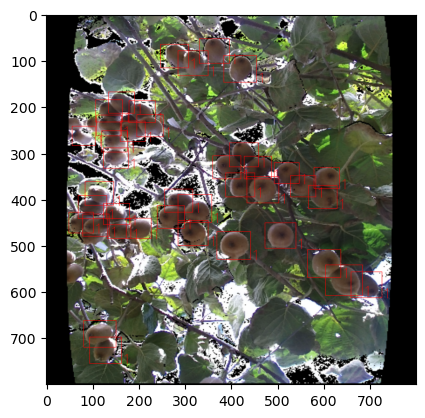

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[ 56  18 116  68]
 [206  21 282  84]
 [363   1 419  48]
 [367  37 428  87]
 [402   7 468  62]
 [446  37 523 101]
 [523  28 595  87]
 [526  78 594 134]
 [605   1 656  43]
 [637   3 692  48]
 [312  92 383 151]
 [288 132 350 184]
 [255 114 319 167]
 [335 157 400 210]
 [381 179 445 232]
 [366 226 423 273]
 [415 235 471 282]
 [213 266 271 314]
 [213 309 267 354]
 [120 359 179 407]
 [115 388 171 435]
 [666 263 716 305]
 [703 279 750 318]
 [671 296 722 338]
 [634 314 682 353]
 [617 343 665 382]
 [566 339 623 385]
 [517 331 576 379]
 [537 365 598 415]
 [565 390 627 442]
 [330 381 375 418]
 [199 410 257 459]
 [238 434 291 478]
 [691 457 744 501]
 [602 553 659 600]
 [266 564 333 620]
 [306 595 374 651]
 [277 612 347 670]
 [353 606 417 659]
 [356 657 416 707]
 [659 575 710 617]
 [649 670 711 721]
 [553 685 619 740]
 [544 723 612 779]
 [596 690 662 745]
 [211 750 267 797]]


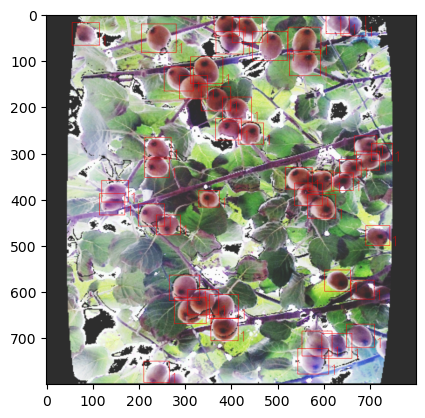

bboxNP:  [[286 175 335 215]
 [293 271 344 314]
 [430 546 484 592]
 [103 557 169 611]
 [184 652 241 699]
 [399 389 453 434]
 [466 596 526 646]
 [135 630 198 682]
 [362 701 424 753]
 [ 76 335 134 384]
 [451 362 508 409]
 [492 428 541 469]
 [564 423 615 465]
 [592 433 645 477]
 [525 415 572 454]
 [626 214 683 260]
 [655 181 721 235]
 [450 232 502 276]
 [198 250 247 290]
 [427 210 478 253]
 [467 192 528 242]
 [141 602 196 647]
 [183 722 245 774]
 [222 745 283 795]
 [316 656 367 698]
 [488 752 541 796]
 [521 721 582 771]
 [460 557 518 605]
 [503 581 558 626]
 [ 50 412 111 462]
 [ 88 379 150 431]
 [ 44 350 102 398]
 [ 88 302 147 350]
 [407 357 456 398]
 [428 328 481 371]
 [584 401 639 446]
 [385 665 434 706]
 [467 163 516 203]
 [197 210 251 256]
 [294 600 350 647]
 [451 126 508 173]
 [489 118 553 171]
 [492  59 547 104]
 [606 162 666 212]
 [576 135 627 178]
 [315 151 375 201]
 [ 49 131 107 179]
 [ 63 579 129 634]
 [619 135 665 173]
 [290 559 341 601]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


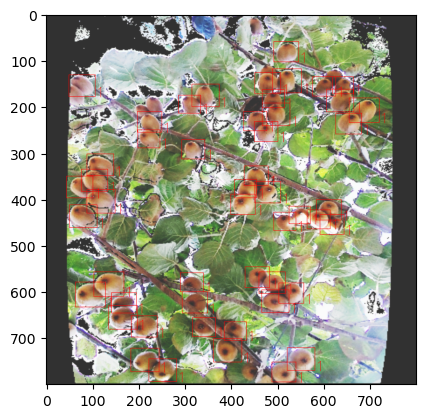

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[285 185 342 232]
 [498 353 541 389]
 [ 46 334 112 389]
 [ 69 497 135 552]
 [113 475 179 529]
 [144 546 202 595]
 [195 565 253 614]
 [ 78 301 144 356]
 [183 157 244 207]
 [199 632 253 678]
 [236 653 293 700]
 [433 465 484 507]
 [518 628 577 676]
 [ 38 271  99 321]
 [ 66 255 130 308]
 [ 77 220 137 270]
 [398 306 458 356]
 [409 273 464 318]
 [450 281 509 329]
 [424 246 481 293]
 [523 334 576 378]
 [564 340 618 385]
 [596 352 649 396]
 [592 317 643 360]
 [366 609 424 657]
 [484 656 535 698]
 [503 690 564 740]
 [633 743 684 785]
 [679 705 730 747]
 [467 510 526 559]
 [509 496 554 534]
 [469 478 516 517]
 [451 145 504 189]
 [189 121 242 165]
 [279  76 335 123]
 [309  54 366 101]
 [430 115 486 162]
 [475  98 532 145]
 [620  67 681 117]
 [637 115 696 164]
 [670  87 733 139]
 [473  68 520 107]
 [455  23 510  68]
 [496  20 556  70]
 [326 564 377 606]
 [585  37 640  82]
 [195  81 251 128]
 [149 517 203 563]
 [306 517 357 559]]


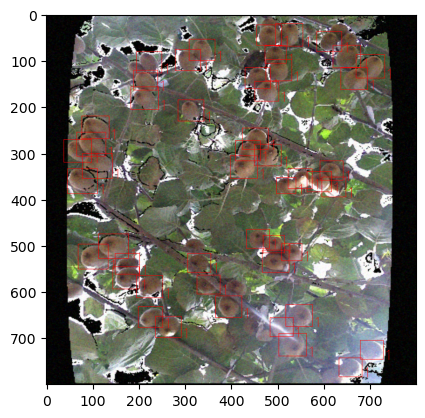

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[326  75 371 112]
 [286 131 337 173]
 [302 101 350 140]
 [131 282 178 321]
 [221 282 278 329]
 [188 312 235 351]
 [171 342 222 384]
 [154 305 205 347]
 [116 317 164 356]
 [149 373 203 418]
 [127 346 174 385]
 [249 347 300 389]
 [290 359 345 404]
 [267 385 315 425]
 [339 368 386 407]
 [366 398 405 431]
 [344 426 400 473]
 [473 324 526 367]
 [511 342 558 381]
 [505 378 556 421]
 [413 553 458 590]
 [365 560 417 604]
 [462 560 513 602]
 [393 590 450 637]
 [441 594 490 635]
 [484 598 537 642]
 [274 604 329 650]
 [309 639 367 687]
 [278 648 325 687]
 [264 670 309 707]
 [295 684 350 729]
 [647 428 709 479]
 [678 457 746 514]
 [656 527 718 578]
 [650 579 715 632]
 [688 355 737 396]
 [669 281 724 326]
 [579 256 626 295]
 [535 259 583 298]
 [507 214 564 260]
 [586 214 635 255]
 [618 209 671 253]
 [545 187 601 234]
 [614 178 663 218]
 [475 190 533 239]
 [449 164 511 215]
 [507 148 562 193]
 [550 135 599 176]
 [316  51 362  89]]


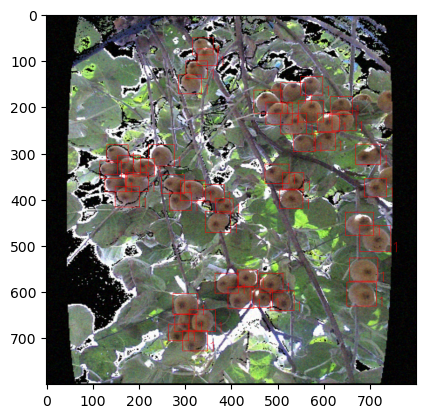

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[283  25 366  94]
 [289  85 355 140]
 [267 127 337 185]
 [252 203 315 254]
 [289 170 353 223]
 [309 217 366 264]
 [365 190 438 251]
 [388 240 460 300]
 [416 182 500 251]
 [448 126 531 195]
 [328 360 386 409]
 [366 307 422 354]
 [413 332 467 378]
 [416 288 479 339]
 [562 339 622 389]
 [588 293 664 356]
 [630 328 694 381]
 [652 360 728 422]
 [575 426 647 485]
 [630 407 696 462]
 [366 411 426 461]
 [416 413 473 460]
 [454 445 515 495]
 [601 575 656 620]
 [428 606 481 650]
 [531 626 597 681]
 [435 716 486 758]
 [466 712 519 756]
 [550 731 597 770]
 [216 720 281 773]
 [ 67 734 124 781]
 [104 743 157 787]
 [146 732 208 784]
 [173 732 230 779]
 [582 609 640 657]
 [616 676 666 717]
 [622 703 667 741]
 [661 718 716 764]
 [572 745 619 784]
 [690 682 739 723]]


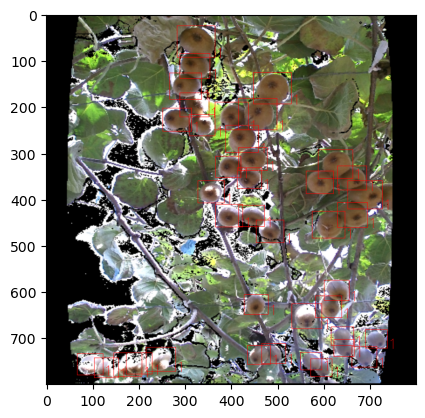

bboxNP:  [[485  15 542  62]
 [509  65 569 115]
 [470  62 529 110]
 [435  28 486  70]
 [ 80  53 129  93]
 [ 66  40 108  75]
 [ 73  82 116 118]
 [ 67 107 118 149]
 [367  65 413 103]
 [368  85 425 132]
 [345  95 398 139]
 [297  81 357 131]
 [279 114 333 159]
 [355 134 408 178]
 [319 151 366 190]
 [298  46 341  82]
 [263  67 317 112]
 [236 100 295 148]
 [207  93 266 142]
 [542 137 604 189]
 [496 151 550 196]
 [452 142 509 189]
 [680 153 738 201]
 [488 192 533 229]
 [264 186 307 222]
 [333 228 383 270]
 [343 262 390 301]
 [299 228 344 265]
 [678 275 725 314]
 [502 270 565 321]
 [467 257 526 306]
 [ 59 251 114 296]
 [ 45 286  94 327]
 [ 43 317  90 356]
 [ 37 351  83 389]
 [109 292 162 336]
 [184 289 235 332]
 [156 310 209 354]
 [130 325 181 367]
 [211 317 254 353]
 [230 338 277 377]
 [505 332 562 379]
 [523 379 582 428]
 [169 396 213 432]
 [162 428 209 467]
 [367 428 413 466]
 [320 429 367 468]
 [288 453 333 490]
 [321 467 372 509]
 [366 462 411 500]
 [401 453 449 492]
 [216 507 273 553]
 [2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


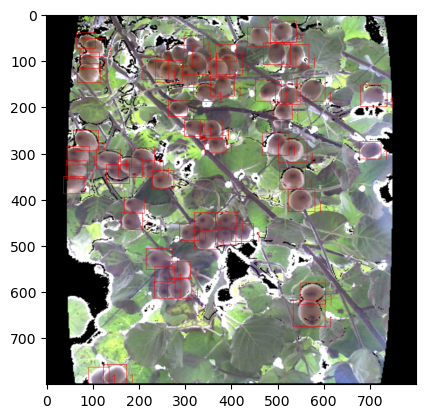

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[445 142 515 200]
 [488 157 560 216]
 [490 207 558 263]
 [ 67 254 135 310]
 [112 273 176 326]
 [103 368 167 421]
 [513 380 577 433]
 [561 378 621 428]
 [139 434 194 479]
 [314 487 376 539]
 [452 514 511 562]
 [276 523 336 573]
 [ 83 535 147 588]
 [440 545 497 592]
 [160 565 215 610]
 [120 575 179 624]
 [467 583 520 627]
 [596 584 660 637]
 [601 623 656 668]
 [481 536 537 583]
 [637 573 705 629]
 [ 44 651 102 700]
 [ 53 596 112 645]
 [113 659 173 709]
 [155 715 206 757]
 [139 679 200 729]
 [175 658 224 699]
 [201 668 256 714]
 [403 671 452 711]
 [396 703 449 747]
 [454 725 516 776]
 [190 721 243 765]
 [418 731 471 775]]


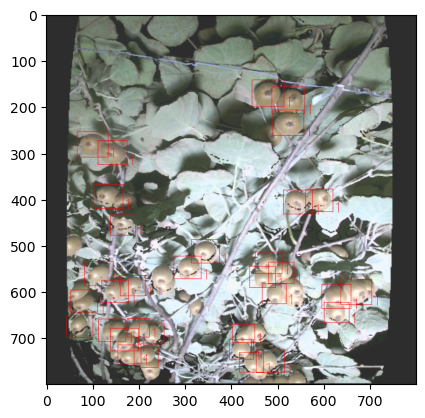

bboxNP:  [[584   1 641  48]
 [554  42 628 103]
 [490  59 556 114]
 [490 106 558 162]
 [139 285 188 326]
 [ 33 317  91 365]
 [184 360 235 402]
 [235 359 290 404]
 [298 364 347 404]
 [213 390 262 431]
 [494 364 545 406]
 [482 396 542 446]
 [572 323 633 373]
 [552 360 615 412]
 [600 378 679 443]
 [669 339 756 410]
 [197 512 246 553]
 [174 543 229 589]
 [ 81 528 135 574]
 [ 60 564 115 609]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


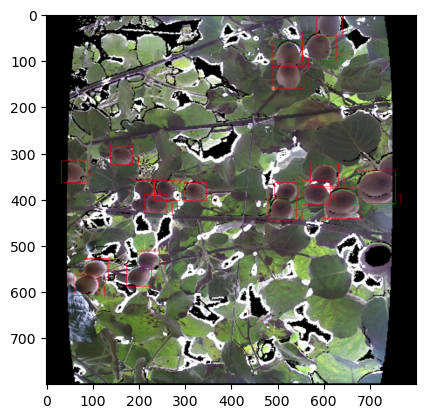

bboxNP:  [[256  32 309  76]
 [296  31 356  81]
 [308  70 372 123]
 [448  59 519 118]
 [488  76 558 134]
 [676  78 736 128]
 [487 150 561 210]
 [507 200 575 256]
 [ 60 123 118 171]
 [137 110 198 160]
 [171 145 222 187]
 [190 167 247 214]
 [109 135 171 187]
 [ 81 154 145 207]
 [135 233 186 275]
 [134 268 189 314]
 [303 268 349 306]
 [351 264 402 306]
 [385 285 438 329]
 [348 301 399 343]
 [302 303 361 351]
 [269 290 320 332]
 [205 350 264 398]
 [254 368 307 412]
 [257 406 312 451]
 [532 406 586 451]
 [523 443 583 493]
 [696 459 758 510]
 [144 578 199 623]
 [114 587 163 628]
 [136 617 185 657]
 [100 628 149 668]
 [297 648 350 692]
 [262 673 316 718]
 [303 681 347 717]
 [ 97 728 150 771]
 [426 643 492 698]
 [403 681 462 729]
 [446 675 506 725]
 [428 710 486 759]
 [556 761 603 800]
 [593 757 642 798]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


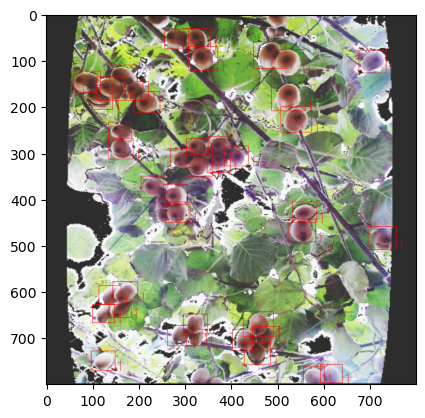

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[216 167 307 242]
 [199 223 274 285]
 [170 256 248 320]
 [224 287 294 345]
 [ 75 272 135 322]
 [ 85 318 146 368]
 [ 41 312  94 356]
 [249 365 311 417]
 [301 376 366 429]
 [278 414 344 468]
 [342 423 397 468]
 [376 423 448 482]
 [467 417 516 458]
 [450 451 504 496]
 [556 443 601 481]
 [590 382 643 426]
 [594 352 643 392]
 [567 322 618 364]
 [583 285 632 326]
 [634  45 693  93]
 [688 486 743 532]
 [658 504 715 551]
 [613 512 667 557]
 [562 550 611 590]
 [595 568 650 614]
 [669 590 718 631]
 [609 607 662 651]
 [658 618 700 653]
 [589 634 646 681]
 [436 528 487 570]
 [217 618 289 678]
 [228 657 307 723]
 [241 710 294 753]
 [193 703 248 748]
 [ 53 635 117 689]
 [ 58 681 111 725]
 [356 709 409 753]
 [414 728 476 779]]


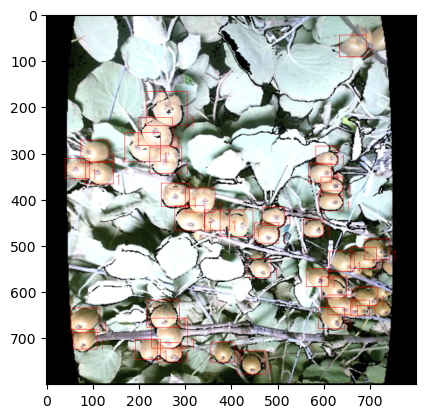

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[511  32 564  76]
 [550  46 591  81]
 [533  71 589 118]
 [418 162 469 204]
 [450 150 494 186]
 [573 178 618 215]
 [575 207 628 251]
 [609 232 662 276]
 [558 228 622 281]
 [606 271 655 312]
 [239 231 296 278]
 [201 251 252 293]
 [409 300 454 338]
 [368 282 423 328]
 [329 270 385 317]
 [299 290 350 332]
 [314 304 372 353]
 [347 336 400 380]
 [307 346 358 389]
 [ 46 325 104 373]
 [311 382 362 425]
 [510 325 557 364]
 [546 328 591 365]
 [581 321 637 368]
 [630 321 679 362]
 [646 351 702 398]
 [571 375 618 414]
 [616 386 673 433]
 [573 409 628 454]
 [273 492 333 542]
 [332 471 394 523]
 [372 467 434 518]
 [328 520 388 570]
 [247 587 316 645]
 [275 654 335 704]
 [411 584 469 632]
 [458 567 515 614]
 [202 725 265 776]
 [382 631 450 687]
 [425 671 480 717]
 [507 613 564 660]
 [398 692 450 735]
 [356 717 420 770]
 [400 734 466 789]
 [166 746 220 792]
 [464 610 513 651]]


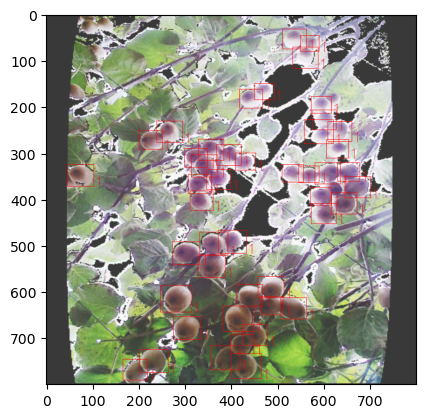

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[286 175 335 215]
 [293 271 344 314]
 [430 546 484 592]
 [103 557 169 611]
 [184 652 241 699]
 [399 389 453 434]
 [466 596 526 646]
 [135 630 198 682]
 [362 701 424 753]
 [ 76 335 134 384]
 [451 362 508 409]
 [492 428 541 469]
 [564 423 615 465]
 [592 433 645 477]
 [525 415 572 454]
 [626 214 683 260]
 [655 181 721 235]
 [450 232 502 276]
 [198 250 247 290]
 [427 210 478 253]
 [467 192 528 242]
 [141 602 196 647]
 [183 722 245 774]
 [222 745 283 795]
 [316 656 367 698]
 [488 752 541 796]
 [521 721 582 771]
 [460 557 518 605]
 [503 581 558 626]
 [ 50 412 111 462]
 [ 88 379 150 431]
 [ 44 350 102 398]
 [ 88 302 147 350]
 [407 357 456 398]
 [428 328 481 371]
 [584 401 639 446]
 [385 665 434 706]
 [467 163 516 203]
 [197 210 251 256]
 [294 600 350 647]
 [451 126 508 173]
 [489 118 553 171]
 [492  59 547 104]
 [606 162 666 212]
 [576 135 627 178]
 [315 151 375 201]
 [ 49 131 107 179]
 [ 63 579 129 634]
 [619 135 665 173]
 [290 559 341 601]]


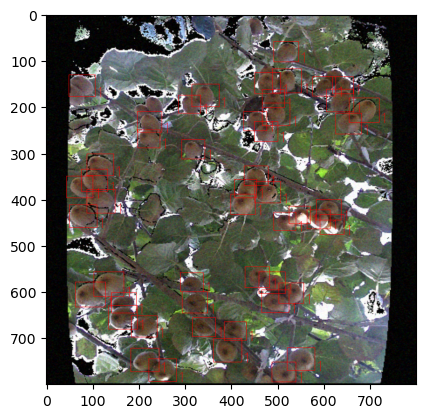

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[216  73 284 129]
 [164 170 239 232]
 [339 121 413 182]
 [365 171 425 221]
 [403 137 466 189]
 [384  95 454 153]
 [467  51 535 107]
 [496 260 562 315]
 [509 303 569 353]
 [403 350 462 398]
 [237 367 294 414]
 [372 406 429 453]
 [173 435 232 483]
 [211 495 271 545]
 [318 531 377 579]
 [383 554 451 610]
 [438 551 504 606]
 [113 570 162 610]
 [123 601 172 642]
 [150 480 201 522]
 [177 485 237 535]
 [ 54 447 109 492]
 [ 67 581 124 628]
 [ 62 543 120 592]
 [ 77 626 133 673]
 [439 639 500 689]
 [475 632 530 678]
 [666 589 729 640]
 [275 704 332 751]
 [432 683 488 730]
 [469 696 533 750]
 [245 726 303 775]
 [526 750 579 794]
 [ 56 653 113 700]
 [691 604 757 659]]


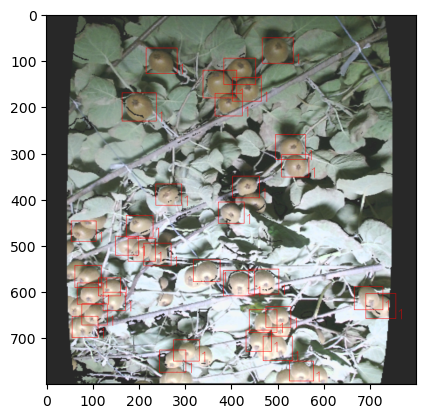

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[244   3 310  57]
 [182  43 253 103]
 [145   9 211  64]
 [139  60 201 112]
 [147 103 209 154]
 [170 181 238 237]
 [109 209 186 273]
 [218 185 296 250]
 [173 237 241 293]
 [403  23 471  79]
 [451  10 517  65]
 [504   6 566  57]
 [515  28 592  92]
 [428  64 498 121]
 [490  78 562 137]
 [435 104 507 164]
 [627 196 691 250]
 [655 153 731 215]
 [657 240 727 298]
 [599 296 663 350]
 [ 94 310 169 372]
 [327 289 389 340]
 [280 315 344 368]
 [331 335 389 384]
 [383 340 450 395]
 [246 351 316 409]
 [136 384 206 442]
 [ 67 457 137 514]
 [302 393 357 439]
 [271 417 326 462]
 [284 461 339 507]
 [237 451 296 500]
 [394 626 454 676]
 [390 670 458 726]
 [432 675 513 742]
 [570 726 648 790]
 [369  25 433  78]
 [ 40 490 108 546]]


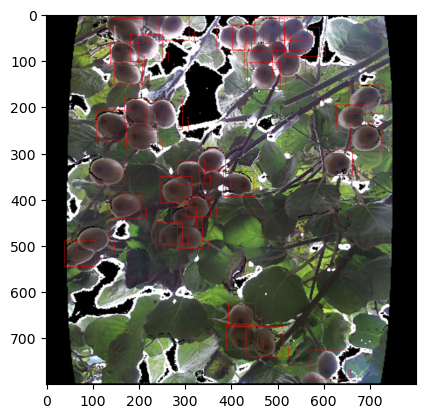

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[422 232 481 281]
 [460 245 513 289]
 [462 287 511 328]
 [507 390 560 434]
 [495 265 551 312]
 [325 681 378 725]
 [207 401 256 442]
 [143 321 198 366]
 [192 334 249 381]
 [ 58 272 120 324]
 [ 90 243 160 301]
 [ 36 353  83 392]
 [ 41 653 101 703]
 [ 98 678 167 735]
 [ 59 678 116 725]
 [316 335 367 378]
 [363 375 416 418]
 [563 507 623 557]
 [604 492 665 542]
 [652 460 703 503]
 [471 411 524 455]
 [295 700 353 748]
 [310 729 366 776]
 [496 100 550 145]
 [239 413 296 460]
 [294 288 345 330]
 [137 291 192 336]
 [383  42 451  98]
 [398   4 456  53]
 [446  10 514  67]
 [532  82 586 128]
 [576  87 634 135]
 [607 105 664 152]
 [603  60 658 106]]


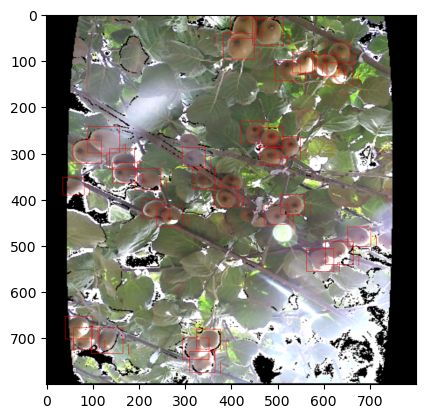

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[271   1 347  64]
 [257  60 331 121]
 [250 107 312 159]
 [228 142 292 196]
 [244 192 300 239]
 [198 209 258 259]
 [250 234 304 279]
 [374 154 453 220]
 [338 195 417 260]
 [300 204 358 253]
 [305 243 373 300]
 [321 295 385 348]
 [277 310 341 364]
 [315 342 373 390]
 [234 370 291 417]
 [481 318 549 375]
 [448 357 510 409]
 [516 362 573 409]
 [535 392 601 446]
 [585 409 659 470]
 [510 431 576 485]
 [465 462 533 518]
 [260 423 316 470]
 [310 432 368 481]
 [344 479 395 521]
 [622 482 679 529]
 [627 523 699 582]
 [683 554 746 606]
 [645 582 711 636]
 [466 643 535 701]
 [450 684 513 735]
 [382 700 450 756]
 [273 660 335 712]]


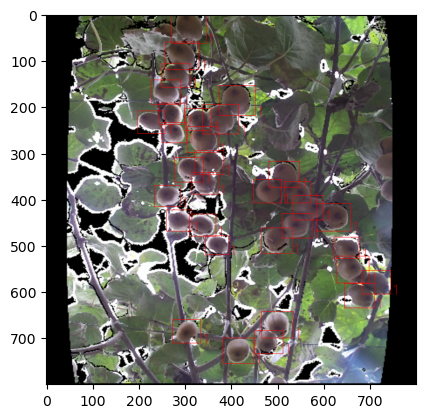

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[335 162 400 215]
 [389 200 451 251]
 [299 189 353 234]
 [260 173 318 221]
 [233  10 280  50]
 [220  39 267  78]
 [197  18 244  57]
 [149 267 201 310]
 [190 283 243 327]
 [207 314 262 359]
 [171 321 226 367]
 [124 313 177 357]
 [132 341 192 391]
 [130 376 184 421]
 [400 367 460 417]
 [437 399 488 441]
 [490 409 550 459]
 [524 439 581 485]
 [581 421 635 467]
 [571 460 635 514]
 [435 440 501 495]
 [388 434 449 484]
 [358 392 422 445]
 [471 542 545 603]
 [570 604 648 668]
 [611 640 703 717]
 [665 656 740 718]
 [369 564 445 626]
 [298 493 356 542]
 [283 539 352 596]
 [258 467 322 520]
 [235 502 301 557]
 [169 528 230 578]
 [ 88 456 139 498]
 [118 496 173 542]
 [123 539 174 581]
 [ 69 482 126 528]
 [ 75 521 135 571]
 [ 45 518  96 560]
 [ 62 549 122 599]
 [ 68 335 112 371]]


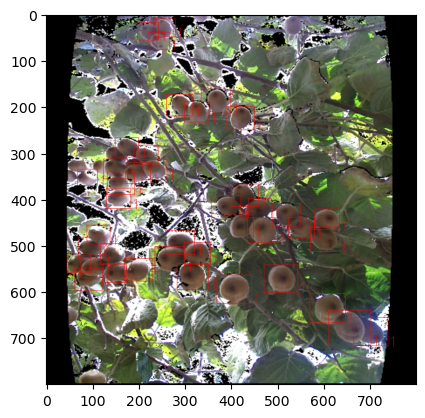

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[135  52 196 102]
 [135  21 192  67]
 [ 99 278 159 328]
 [148 273 204 320]
 [158 310 213 355]
 [186 281 250 334]
 [201 350 260 398]
 [235 331 290 376]
 [243 292 301 340]
 [269 178 332 230]
 [293 214 350 260]
 [ 54 496 113 545]
 [100 489 162 540]
 [ 84 535 147 587]
 [127 556 191 609]
 [169 503 233 556]
 [171 543 233 595]
 [167 468 226 517]
 [192 442 250 490]
 [400 365 458 414]
 [424 390 477 434]
 [274 528 321 567]
 [313 529 367 575]
 [313 499 362 539]
 [339 506 394 551]
 [373 496 430 542]
 [400 520 450 560]
 [543 471 596 515]
 [584 479 643 528]
 [605 449 666 499]
 [441 706 509 762]
 [545 726 609 779]
 [586 704 652 759]
 [632 740 696 793]
 [590  59 649 107]
 [685  71 742 118]
 [667  39 724  85]]


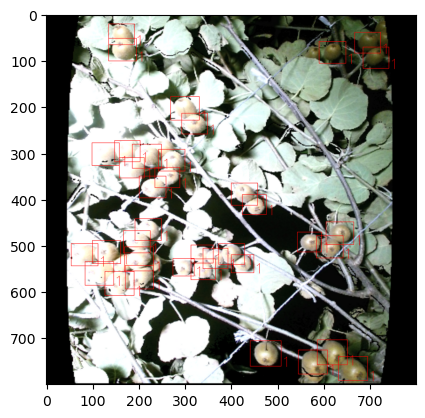

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


bboxNP:  [[394 287 445 329]
 [362 325 415 369]
 [318 320 366 359]
 [433 380 481 419]
 [479 386 526 425]
 [462 349 511 389]
 [123 178 180 225]
 [126 146 173 185]
 [ 90 157 139 198]
 [ 86 125 137 167]
 [252 545 316 598]
 [220 531 275 576]
 [352 298 400 337]
 [324 290 367 326]
 [437 416 483 453]
 [477 426 526 467]
 [439 453 488 493]
 [489 582 555 637]
 [550 582 617 639]
 [616 306 672 353]
 [663 309 717 354]
 [639 598 707 654]
 [673 562 735 614]
 [699 282 753 328]
 [699 234 759 284]
 [661 217 721 267]
 [707 196 762 242]
 [695 117 763 173]
 [649 109 715 164]
 [680  78 734 123]
 [175 659 230 704]
 [176 707 229 751]
 [153 687 197 723]]


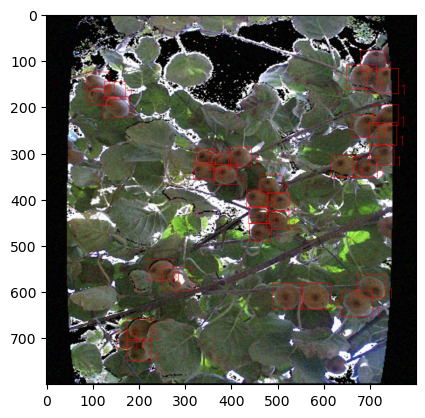

str

In [40]:
#display image with bbox
#labels

bboxNP = []
fontScale = 1
xmin = []
ymin = []
xmax = []
ymax = []
bboxNP = []
for im in range(numImgs):
    labels = np.ones(tr_len[im], dtype=int)
    #labels_nk = np.zeros(nklen, dtype=int)
    #labels = np.append(labels_k, labels_nk, axis=0)
    #labels = labels

    #image to numpy array
    #imgClone = np.copy(numpy.array(SampleImg())
    imgClone = tr_ds[im,:,:,:]
    #print(imgClone)
    #print(type(imgClone))
    #print(imgClone.shape)

    #bboxNP[29][0]
    #imgClone
    
    bboxNP = bb_tr_lst[im]
    #print(FileNameLst_tr[im])
    print("bboxNP: ", bboxNP)

    #for i in range(klen+nklen):
    for i in range(tr_len[im]):
        #bboxNP[:,0] = (bboxNP_tmp[:,0]*imsize/OrgWith)
        #print(i)
        #print(tr_len[im])
        xmin = bboxNP[i,0].astype(int)
        ymin = bboxNP[i,1].astype(int)
        xmax = bboxNP[i,2].astype(int)
        ymax = bboxNP[i,3].astype(int)
        dx = xmax - xmin
        dy = ymax - ymin
        #if i < tr_len[im]:
        cv2.rectangle(imgClone, (xmin, ymin, dx, dy), color = (255,0,0), thickness = 1)
        cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)
        #else:
            #cv2.rectangle(imgClone, (xmin, ymin, dx, dy), color = (255,0,0), thickness = 1)
            #cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)
            
    #type(str(int(labels[i])))    
    #cv2.rectangle(imgClone, (0, 0, 50, 50), color = (0,255,0), thickness = 3)

    plt.imshow(imgClone)
    plt.show()

type(str(int(labels[1])))  

# Model formulation

In [42]:
#import keras.backend as K

In [43]:
# cell boundaries
#S=25
#print(imsize) #size of image
#dx = imsize/25 #size of cell
#dy = imsize/25
#x1_celda = np.zeros((S,S))
#y1_celda = np.zeros((S,S))
#x2_celda = np.zeros((S,S))
#y2_celda = np.zeros((S,S))
#print(x1_celda.shape)
#for i in range(25):
#    for j in range(25):
#        x1_celda[i,j] =(dx)*i
#        y1_celda[i,j] =(dy)*j
#        x2_celda[i,j] =(dx)*(i+1)
#        y2_celda[i,j] =(dy)*(j+1)

#print(x1_celda)


In [44]:
# VGG Network model
#Base Model: 0 to 13 layers are pretrained
#Top model: 14 to 18 layers are trainable

inputShape = (imsize, imsize, 3)

VGGmodel = tf.keras.applications.vgg16.VGG16(
    include_top=False,
    weights='imagenet',
    input_tensor=None,
    input_shape=inputShape,
    pooling=None
)
# Freeze the base_model
for layer in VGGmodel.layers[:13]:
    layer.trainable = False
for layer in VGGmodel.layers[13:19]:
    layer.trainable = False

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
#for layer in model.layers[:18]:
#   layer.trainable = False
#for layer in model.layers[249:]:
#   layer.trainable = True


# Base Model (not trainable)    
#baseModel_output = model.get_layer("block4_conv3").output
#baseModel = Model(inputs = model.input, outputs = model.get_layer("block4_conv3").output)
YoloIn = VGGmodel.input
baseModel = Model(inputs = YoloIn, outputs = VGGmodel.get_layer("block5_pool").output)
###baseModel.trainable = False

# Top Model (not trainable)    
#topModel_output = model.get_layer("block4_conv3").output
#topModel = Model(inputs = model.get_layer("block4_conv3").output, outputs = model.get_layer("block5_pool").output)

# Non Train Model (not trainable)    
#nonTrainModel_output = model.get_layer("block4_conv3").output
#nonTrainModel = Model(inputs = model.input, outputs = model.get_layer("block5_pool").output)

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
#for i, layer in enumerate(baseModel.layers):
#    print(i, layer.name)
#for i, layer in enumerate(topModel.layers):
#    print(i+13, layer.name)

#VGGmodel.summary()
baseModel.summary(show_trainable=True)
#topModel.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer (InputLayer)    │ (None, 800, 800, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block1_conv1 (Conv2D)       │ (None, 800, 800, 64)  │      1,792 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block1_conv2 (Conv2D)       │ (None, 800, 800, 64)  │     36,928 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block1_pool (MaxPooling2D)  │ (None, 400, 400, 64)  │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block2_conv1 (Conv2D)       │ (None, 400, 400, 128) │     73,856 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block2_conv2 (Conv2D)       │ (None, 400, 400, 128) │    147,584 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block2_pool (MaxPooling2D)  │ (None, 200, 200, 128) │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block3_conv1 (Conv2D)       │ (None, 200, 200, 256) │    295,168 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block3_conv2 (Conv2D)       │ (None, 200, 200, 256) │    590,080 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block3_conv3 (Conv2D)       │ (None, 200, 200, 256) │    590,080 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block3_pool (MaxPooling2D)  │ (None, 100, 100, 256) │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block4_conv1 (Conv2D)       │ (None, 100, 100, 512) │  1,180,160 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block4_conv2 (Conv2D)       │ (None, 100, 100, 512) │  2,359,808 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block4_conv3 (Conv2D)       │ (None, 100, 100, 512) │  2,359,808 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block4_pool (MaxPooling2D)  │ (None, 50, 50, 512)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block5_conv1 (Conv2D)       │ (None, 50, 50, 512)   │  2,359,808 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block5_conv2 (Conv2D)       │ (None, 50, 50, 512)   │  2,359,808 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block5_conv3 (Conv2D)       │ (None, 50, 50, 512)   │  2,359,808 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ block5_pool (MaxPooling2D)  │ (None, 25, 25, 512)   │          0 │   -   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [45]:
#create a Yolo based Model with fully conected layer and output = (*,25,25,5)
x = baseModel(YoloIn, training=False)


#inEM = model.get_layer("block5_pool").output #topModel.output # take the output of the topModel
x = keras.layers.Flatten()(x) #flaten player
# let's add a fully-connected layer
d = keras.layers.Dense(256)(x)
#d = keras.layers.Dense(1024)(d)
d = keras.layers.Normalization(axis=None)(d)
#d = keras.layers.Dropout(0.5)(d)
#Kini = tf.keras.initializers.Constant(value=0.5)
#x = keras.layers.Dense(625,activation='sigmoid')(d) #xc, yc #, use_bias =True, kernel_initializer=Kini)(d)
#y = keras.layers.Dense(625,activation='sigmoid')(d)
#w = keras.layers.Dense(625,activation='exponential')(d)
#h = keras.layers.Dense(625,activation='exponential')(d)
#po = keras.layers.Dense(625,activation='sigmoid')(d) #prob
#x = keras.layers.Reshape((S, S, 1))(x)
#y = keras.layers.Reshape((S, S, 1))(y)
#w = keras.layers.Reshape((S, S, 1))(w)
#h = keras.layers.Reshape((S, S, 1))(h)
d = keras.layers.Dense(3125,activation='silu')(d)
YoloOut = keras.layers.Reshape((S, S, 5))(d)
#YoloOut = keras.layers.Concatenate(axis=-1)([x, y, w, h, po])


# End Model (not trainable)    
YoloModel = keras.Model(inputs = YoloIn, outputs = YoloOut, name = "YoloModel") #output = (None, 25, 25, 5)

for layer in YoloModel.layers[:2]:
    layer.trainable = False

###YoloModel.summary() 
YoloModel.summary(show_trainable=True)

#inputs = keras.Input(shape=(None, None, 3))
#processed = keras.layers.RandomCrop(width=32, height=32)(inputs)
#conv = keras.layers.Conv2D(filters=2, kernel_size=3)(processed)
#pooling = keras.layers.GlobalAveragePooling2D()(conv)
#feature = keras.layers.Dense(10)(pooling)

#full_model = keras.Model(inputs, feature)
#backbone = keras.Model(processed, conv)
#activations = keras.Model(conv, feature)
                         
# and reshape the output
#y = keras.layers.Reshape((25, 25, 5))(d)
#y = YoloOut
#print(type(y))
#print (y.shape)

Model: "YoloModel"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━┓
┃ Layer (type)                ┃ Output Shape          ┃    Param # ┃ Trai… ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━┩
│ input_layer (InputLayer)    │ (None, 800, 800, 3)   │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ functional (Functional)     │ (None, 25, 25, 512)   │ 14,714,688 │   N   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ flatten (Flatten)           │ (None, 320000)        │          0 │   -   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense (Dense)               │ (None, 256)           │ 81,920,256 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ normalization               │ (None, 256)           │          3 │   Y   │
│ (Normalization)             │                       │            │       │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ dense_1 (Dense)             │ (None, 3125)          │    803,125 │   Y   │
├─────────────────────────────┼───────────────────────┼────────────┼───────┤
│ reshape (Reshape)           │ (None, 25, 25, 5)     │          0 │   -   │
└─────────────────────────────┴───────────────────────┴────────────┴───────┘

 Total params: 97,438,072 (371.70 MB)

 Trainable params: 82,723,381 (315.56 MB)

 Non-trainable params: 14,714,691 (56.13 MB)

In [46]:
#import keras.backend as K


def xywh2minmax(xy, wh):  #? * 25 * 25 * 1 * 1 * 2,  ? * 25 * 25 * 1 * 1 * 2
    #print("xy: ",xy.shape)
    #print("wh: ",wh.shape)
    xy_min = xy - wh / 2 #? * 25 * 25 * 1 * 1 * 2
    xy_max = xy + wh / 2 #? * 25 * 25 * 1 * 1 * 2

    #print("xy_min: ",xy_min.shape)
    #print("xy_max: ",xy_max.shape)
    return xy_min, xy_max #? * 25 * 25 * 1 * 1 * 2, #? * 25 * 25 * 1 * 1 * 2


def iou(pred_mins, pred_maxes, true_mins, true_maxes, bb_mask):
    #tf.print("pred_mins: ", pred_mins[0,0:2,0:2,:2]) # ?xSxSx2
    #print("pred_maxes: ", pred_maxes[0,0:2,0:2,:2]) #?xSxSx2
    #print("true_maxes: ", true_maxes[0,0:2,0:2,:2]) #?xSxSx2
    #tf.print("bb_mask: ", bb_mask[0,0:3,0:3]) #?xSxS

    d_pred = pred_maxes - pred_mins
    Areas_pred = d_pred[...,0] * d_pred[...,1]
    SumAreas_pred = tf.reduce_sum(Areas_pred)
    tf.print("SumAreas_pred: ", SumAreas_pred)
    tf.print("tf.shape(pred_mins)): ", tf.shape(pred_mins)) #dimensiones de y_pred
    d_true = true_maxes - true_mins
    Areas_true = d_true[...,0] * d_true[...,1]
    SumAreas_true = tf.reduce_sum(Areas_true)
    tf.print("SumAreas_true: ", SumAreas_true)
    
    intersect_mins = tf.math.maximum(pred_mins, true_mins)
    intersect_maxes = tf.math.minimum(pred_maxes, true_maxes)
    #print("intersect_mins: ", intersect_mins.shape)
    #print("intersect_mins: ", intersect_mins[0,0,0,0,0,0:2]) #[[[...]]] 
    #print("intersect_maxes: ", intersect_maxes.shape)
    #print("intersect_maxes: ", intersect_maxes[0,0,0,0,0,0:2]) #[[[...]]] 
    intersect_wh = tf.math.maximum(intersect_maxes - intersect_mins, 0.)
    #print("intersect_wh: ", intersect_wh.shape)
    #print("intersect_wh: ", intersect_wh[0,0,0,0,0,0:2]) #[[[...]]] 
    intersect_areas = intersect_wh[..., 0] * intersect_wh[..., 1] * bb_mask
    #print("intersect_areas: ", intersect_areas[0,0:3,0:3])
    tf.print("intersect_areas: ", intersect_areas)
    #print("intersect_areas: ", intersect_areas[0,0,0,0,0]) #[[...]] 
    
    #DIoU: Distances
    mins_of_mins = tf.math.minimum(pred_mins, true_mins)
    maxes_of_maxes = tf.math.maximum(pred_maxes, true_maxes)
    #print("mins_of_mins: ", mins_of_mins[0,0,0,0,0,0:2])
    #print("maxes_of_maxes: ", maxes_of_maxes[0,0,0,0,0,0:2])
    C_diag_sq = tf.math.square(maxes_of_maxes-mins_of_mins)
    #print("C_diag_sq: ", C_diag_sq[0,0:3,0:3])
    #print("C_diag_sq: ", C_diag_sq.shape)
    #print("C_diag_sq.shape: ", C_diag_sq.shape)
    
    #dimTF = tf.shape(C_diag_sq)
    #dimNP = np.array(dimTF)
    #print("dimTF", dimTF[0])
    #print("dimTF.shape", dimTF.shape)
    #NumI = K.cast(dimTF[0], dtype='float32')
    #NumS1 = K.cast(dimTF[1], dtype='float32')
    #NumS2 = K.cast(dimTF[2], dtype='float32')
    #NI = int(NumI)
    #S1 = int(NumS1)
    #S2 = int(NumS2)
    #print("NumI: ", NumI)
    #print("NumS1: ", NumS1)
    #print("NumS2: ", NumS2)
    eps_np = 0.001*np.ones((int(ImgLossF),S,S), dtype=np.float32)
    eps_tf = tf.constant(eps_np) # para evitar division por zero
    #print("eps_tf: ", eps_tf.shape)
    C_diag = tf.math.reduce_sum(C_diag_sq,axis=3)*bb_mask# + eps_tf
    #print("C_diag.type: ", type(C_diag))
    #print("C_diag: ", C_diag[0,0:3,0:3])
    
    Convex_dif = maxes_of_maxes-mins_of_mins
    Convex_Area = Convex_dif[...,0] * Convex_dif[...,1]# + eps_tf
    #tf.print("Convex_dif[...,0]: ", Convex_Area[0,:2,:2])
    #tf.print("Convex_dif[...,1]: ", Convex_Area[0,:2,:2])
    #tf.print("Convex_Area: ", Convex_Area[0,:2,:2])
    
    c_bb_gt = (true_maxes + true_mins)/2
    c_bb_pr = (pred_maxes + pred_mins)/2
    #print("c_bb_gt: ", c_bb_gt[0,0,0,0,0,0:2])
    #print("c_bb_pr: ", c_bb_pr[0,0,0,0,0,0:2])
    dist_c_bb_sq = tf.math.square(c_bb_gt - c_bb_pr)
    #print("dist_c_bb_sq: ", dist_c_bb_sq[0,0,0,0,0,0:2])
    dist_c_bb = tf.math.reduce_sum(dist_c_bb_sq,axis=3) * bb_mask
    #print("dist_c_bb: ", dist_c_bb[0,0:3,0:3])
    
    pred_wh = pred_maxes - pred_mins
    true_wh = true_maxes - true_mins
    pred_areas = pred_wh[..., 0] * pred_wh[..., 1] * bb_mask
    true_areas = true_wh[..., 0] * true_wh[..., 1] * bb_mask
    #print ("pred_areas: ", pred_areas[0,0:3,0:3])
    #print ("true_areas: ", true_areas[0,0:3,0:3])
    
    union_areas = pred_areas + true_areas - intersect_areas# + eps_tf
    #print ("union_areas: ", union_areas[0,0:3,0:3]) 
    tf.print ("union_areas: ", union_areas) #[[...]] 
    #print ("union_areas shape: ", union_areas.shape) #[[...]] 
    #print ("union_areas type: ", type(union_areas)) #[[...]] 
    #if union_areas <= 0:
    #    union_areas = 0.0001 # valor muy chico

    tf.print("union_areas Nonzero: ", tf.math.count_nonzero(union_areas)) # print number of union_areas!=0
    tf.print("C_diag Nonzero: ", tf.math.count_nonzero(C_diag)) # print number of C_diag!=0
    zero = tf.constant(0, dtype=tf.float32)
    union_areasWhere = tf.not_equal(union_areas, zero)
    union_areasInx = tf.where(union_areasWhere) # indicces where valus are non-zero
    union_areasNonZero = tf.gather_nd(params = union_areas, indices = union_areasInx, batch_dims=0) #data of union_areas that are non-zero
    intersect_areasNonZero = tf.gather_nd(params = intersect_areas, indices = union_areasInx, batch_dims=0) #data of intersect_areas that are non-zero
    tf.print("union_areasInx: ", union_areasInx) # Indexes
    tf.print("union_areasInx: ", union_areasInx) # Indexes
    tf.print("union_areasNonZero: ", union_areasNonZero) # matrix with union_areas!=0
    tf.print("tf.shape(union_areasNonZero): ", tf.shape(union_areasNonZero)) # Shape of union_area non_zero matrix
    tf.print("intersect_areasNonZero: ", intersect_areasNonZero) # matrix with intersect_areas!=0
    tf.print("tf.shape(intersect_areasNonZero): ", tf.shape(intersect_areasNonZero)) # Shape of intersect_areas non_zero matrix
    
    C_diagWhere = tf.not_equal(C_diag, zero)
    C_diagInx = tf.where(C_diagWhere) # indicces where valus are non-zero
    C_diagNonZero = tf.gather_nd(params = C_diag, indices = C_diagInx, batch_dims=0) #data of C_diag that are non-zero
    dist_c_bbNonZero = tf.gather_nd(params = dist_c_bb, indices = C_diagInx, batch_dims=0) #data of C_diagInx that are non-zero
    tf.print("C_diagInx: ", C_diagInx) # Indexes
    tf.print("C_diagNonZero: ", C_diagNonZero) # matrix with C_diag!=0
    tf.print("tf.shape(C_diagNonZero): ", tf.shape(C_diagNonZero)) # Shape of C_diag non_zero matrix
    tf.print("dist_c_bbNonZero: ", dist_c_bbNonZero) # matrix with dist_c_bb!=0
    tf.print("tf.shape(dist_c_bbNonZero): ", tf.shape(dist_c_bbNonZero)) # Shape of dist_c_bb non_zero matrix
    
    iou_scores = ((intersect_areasNonZero / union_areasNonZero) - (dist_c_bbNonZero/C_diagNonZero))
    #iou_scores = ((intersect_areas / Convex_Area))*bb_mask
    tf.print("iou_scores: ", iou_scores)
    tf.print("tf.shape(iou_scores): ", tf.shape(iou_scores))
    return iou_scores

In [47]:
#INPUT:
# feats: Boxes coordinates (may be Bounding Ground Truth or Predicted) 
#    Format(#Images, S, S, [xc, yc,w,h]')
#    xc = bounding box center in x-axis: Normlized to cell: [0,1]<=>[xmin,xmax]
#    yc = bounding box center in y-axis: Normlized to cell: [0,1]<=>[ymin,ymax]
#    w = bounding box width in x-axis: Normlized to image: [0,1]<=>[0,imsize]
#    h = bounding box hight in y-axis: Normlized to image: [0,1]<=>[0,imsize]
#
#OUTPUT:

#import keras.backend as K

def yolo_head(feats): #Para predict_box o label_Box: ? * 25 * 25 * 1 * 4
    # Dynamic implementation of conv dims for fully convolutional model.
    #print("feats.shape", feats.shape[0])
    #print("feats.shape--------------", K.shape(feats)[0])
    #conv_dims = K.shape(feats)[1:3]  # assuming channels last(25x25)
    conv_dims = tf.shape(feats)[1:3]  # assuming channels last(25x25)
    #num_imgs = K.shape(feats)[0]  # number of images
    num_imgs_loss = tf.shape(feats)[0]  # number of images
    # In YOLO the height index is the inner most iteration.
    #conv_width_index = K.arange(0, stop=conv_dims[0]) #(0 a S-1)
    conv_width_index = tf.range(0, limit=conv_dims[0]) #(0 a S-1)
    #conv_height_index = K.arange(0, stop=conv_dims[1]) #(0 a S-1)
    conv_height_index = tf.range(0, limit=conv_dims[1]) #(0 a S-1)
    #conv_height_index = K.tile(conv_height_index, [conv_dims[0]]) #[0-(S-1) [0-(S-1) ...S veces... 0-(S-1)]
    conv_height_index = tf.tile(conv_height_index, [conv_dims[0]]) #[0-(S-1) [0-(S-1) ...S veces... 0-(S-1)]
    #conv_width_index = K.tile(
    #    K.expand_dims(conv_width_index, 0), [conv_dims[1], 1])    
    conv_width_index = tf.tile(
        tf.expand_dims(conv_width_index, 0), [conv_dims[1], 1])    #[[0-(S-1)]
                                                                  # [0-(S-1)]
                                                                  # ... S veces
                                                                  # [0-(S-1)]]  
    #print("conv_height_index.shape: ", conv_height_index)
    #print("conv_width_index.shape: ", conv_width_index)
    
    #conv_width_index = K.flatten(K.transpose(conv_width_index))   
    NumElem = conv_dims[0] * conv_dims[1]
    #print("conv_width_index: ",conv_width_index.shape)
    #print("conv_width_index: ",NumElem.numpy())
    #conv_width_index = tf.flatten(tf.transpose(conv_width_index))   
    conv_width_index = tf.reshape(tf.transpose(conv_width_index), [NumElem])    #[0 ... 0 25 veces
                                                                                        # 1 ... 1 
                                                                                        # ... 
    #print("conv_height_index: ", conv_height_index)                                    # 24 ...24])
    #print("conv_width_index: ", conv_width_index)
    
    #conv_index = K.transpose(K.stack([conv_height_index, conv_width_index])) 
    conv_index = tf.transpose(tf.stack([conv_height_index, conv_width_index])) #[[ 0, 0]
                                                                             # [ 1, 0]
                                                                             # [ 2, 0]
                                                                             # ...
                                                                             # [22, 24]
                                                                             # [23, 24]
                                                                             # [24, 24]], shape=(625, 2), dtype=int32)
    
    #print("conv_index: ", conv_index)
    #print("conv_width_index: ", conv_width_index)
    #print("[conv_height_index, conv_width_index]: ",[conv_height_index, conv_width_index])
    
    #conv_index = K.reshape(conv_index, [1, conv_dims[0], conv_dims[1], 2])
    conv_index = tf.reshape(conv_index, [1, conv_dims[0], conv_dims[1], 2])
    #conv_index = K.cast(conv_index, K.dtype(feats))   
    feast_type = feats.dtype
    #print("feast_type: ", feast_type)
    conv_index = tf.cast(conv_index, feast_type)                        # Dim: 1 * 25 * 25 * 1 * 2
                                                                             #[[[[[ 0.000, 0.000]]
                                                                             # [[ 1.000, 0.000]]
                                                                             # [[ 2.000, 0.000]]
                                                                             # ...
                                                                             # [[ 24.000, 0.000]]]
                                                                             # ...
                                                                             # [[[ 0.000, 1.000]]
                                                                             # ...
                                                                             # [[ 24.000, 1.000]]
                                                                             # ...
                                                                             # [[ 0.000, 24.000]]                                                      
                                                                             # ...
                                                                             # [[[22.000, 24.000]]
                                                                             # [[23.000, 24.000]]
                                                                             # [[24.000, 24.000]]]]]
    #conv_index = K.tile(conv_index,[feats.shape[0], 1, 1, 1])
    conv_index = tf.tile(conv_index,[num_imgs_loss, 1, 1, 1])
    #print("conv_index.shape: ", conv_index.shape)
    

    #conv_dims = K.cast(K.reshape(conv_dims, [1, conv_dims[0], conv_dims[1], 2]), K.dtype(feats)) #[[[[[25.000 25.000]]]]]
    #print("conv_dims: ", conv_dims.shape)
    #conv_dims = K.cast(conv_dims, K.dtype(feats))
    conv_dims = tf.cast(conv_dims, feats.dtype)
    #imsize_cast = K.cast(imsize, K.dtype(feats))
    imsize_cast = tf.cast(imsize, feats.dtype)
    
    # Se obtiene posicion de xc,yc,w,h relativa a imagen completa original (800,800)
    #print("feats[..., :2]: ",feats[..., :2]) # ? * 25 * 25 * 1 * 2 (xc,yc)
    
    # Se cambia a formato x1,y1,x2,y2
    #print("feats: ", feats.shape[0])
    #print("conv_dims: ", conv_dims.shape)
    box_xy = (feats[..., :2] + conv_index) / conv_dims[0] * imsize_cast 
    box_wh = feats[..., 2:4] * imsize_cast
    #print("box_xy: ", box_xy)
    #print("box_wh: ", box_wh)
    

    return box_xy, box_wh

In [52]:
## YOLO LOSS FUNCTION
#//////////////////////

# y_true: ground truth Bounding Boxes. (References). 
#    Format(#Images, S, S, [xc, yc,w,h, Pgt]')
#    xc = bounding box center in x-axis: Normlized to cell: [0,1]<=>[xmin,xmax]
#    yc = bounding box center in y-axis: Normlized to cell: [0,1]<=>[ymin,ymax]
#    w = bounding box width in x-axis: Normlized to image: [0,1]<=>[0,imsize]
#    h = bounding box hight in y-axis: Normlized to image: [0,1]<=>[0,imsize]
#    Pgt = 1 if Bounding Box is in Cell
#    Pgt = 0 if Bounding Box is not in Cell
#
# y_pred: ground truth Bounding Boxes. (References). 
#    Format(#Images, S, S, [xc, yc,w,h, Pgt]')
#    xc = bounding box center in x-axis: Normlized to cell: [0,1]<=>[xmin,xmax]
#    yc = bounding box center in y-axis: Normlized to cell: [0,1]<=>[ymin,ymax]
#    w = bounding box width in x-axis: Normlized to image: [0,1]<=>[0,imsize]
#    h = bounding box hight in y-axis: Normlized to image: [0,1]<=>[0,imsize]
#    Ppr = probability predicted by NN in the range [0,1]

import keras.backend as K

def yolo_loss(y_true, y_pred): #y_true = Yref
    #label_class = y_true[..., :20]  # ? * 25 * 25 * 5
    label_box = y_true[..., 0:4]  # ? * 25 * 25 * 4 #coordenadas xc,yc,w,h,
    response_mask = y_true[..., 4]  # ? * 25 * 25 # Pgt= 1 si presente, 0 si no
    y_pred_shape = tf.shape(y_pred)
    y_true_shape = tf.shape(y_true)
    tf.print("ImgLossF: ", ImgLossF) #Numero de Imagenes en entrenamiento
    tf.print("True number of Images in Loss Function: ", y_true_shape[0]) #Numero de Imagenes en entrenamiento
    tf.print("tf.shape(y_pred)): ", y_pred_shape) #dimensiones de y_pred
    tf.print("tf.reduce_sum(y_pred)): ", tf.reduce_sum(y_pred)) #sum of y_pred
    tf.print("tf.shape(y_true)): ", y_true_shape) #dimensiones de y_true
    #tf.print("label_box:", label_box[0,:3,:3])
    #tf.print("response_mask:", K.sum(response_mask))
    #tf.print("response_mask:", tf.math.reduce_sum(response_mask))
    tf.print("label_box:", tf.shape(label_box))
    tf.print("response_mask:", tf.shape(response_mask))
    #response_mask = K.expand_dims(response_mask,3)  # ? * 25 * 25 * 1
    label_box0 = label_box[:,:,:,0] 
    label_box1 = label_box[:,:,:,1]
    label_box2 = label_box[:,:,:,2]
    label_box3 = label_box[:,:,:,3]
    tf.print("Sum label_box2 x label_box3: ", tf.reduce_sum(label_box2 * label_box3))
    #num_imgs_loss = tf.shape(y_true)[0]  # number of images

    AnchorBox_tmp = tf.ones([y_true_shape[0],S,S,4], dtype = tf.float32)
    #AnchorBox_tmp = tf.ones([int(ImgLossF),S,S,4], dtype = tf.float32)
    #AnchorBoxNP0 = np.zeros((num_imgs_loss_true,S,S,4))
    #AnchorBoxNP[...,:] = [0.5,0.5,0.01,0.01]
    #AnchorBox_tmp = tf.convert_to_tensor(AnchorBoxNP, dtype=tf.float32)
    #AnchorBox = tf.convert_to_tensor(AnchorBoxNP0, dtype=tf.float32)
    AnchorBox0 = AnchorBox_tmp[:,:,:,0] * response_mask * 0.5
    AnchorBox1 = AnchorBox_tmp[:,:,:,1] * response_mask * 0.5
    AnchorBox2 = AnchorBox_tmp[:,:,:,2] * response_mask * (60/8060)
    AnchorBox3 = AnchorBox_tmp[:,:,:,3] * response_mask * (60/800)
    #AnchorBox = K.stack([AnchorBox0,AnchorBox1,AnchorBox2,AnchorBox3])
    AnchorBox = tf.stack([AnchorBox0,AnchorBox1,AnchorBox2,AnchorBox3], axis=-1)
    AnchorBoxTr = tf.transpose(AnchorBox)
    #tf.print("AnchorBox:", AnchorBox.shape)
    tf.print("tf.reduce_sum(AnchorBox):", tf.reduce_sum(AnchorBox))
    tf.print("tf.shape(AnchorBox):", tf.shape(AnchorBox))
    #aux = tf.slice(AnchorBox, [0,0,0,0], [1,3,3,4])
    
    tf.print("Anchorbox Tensor NumElements Nonzero: ", tf.math.count_nonzero(AnchorBox)) # print number of Anchor Boxes in image
    zero = tf.constant(0, dtype=tf.float32)
    AnchorWhere = tf.not_equal(AnchorBox, zero)
    AnchorInx = tf.where(AnchorWhere) # indicces where valus are non-zero
    AnchorInxTr = tf.transpose(AnchorInx)
    AnchorData = tf.gather_nd(params = AnchorBox, indices = AnchorInx, batch_dims=0) #data of AnchorBoxes that are non-zero


    #tf.print("AnchorWhere: ", AnchorWhere)
    tf.print("shape(AnchorInx): ", tf.shape(AnchorInx))
    tf.print("AnchorInx[0]: ", AnchorInx[0])
    #tf.print("AnchorInxTr[0]: ", AnchorInxTr[0])
    tf.print("shape(AnchorData): ", tf.shape(AnchorData))
    tf.print("AnchorData: ", AnchorData[0:20])
    sum_AnchorData = tf.reduce_sum(AnchorData)
    sum_label_box = tf.reduce_sum(label_box)
    tf.print("sum_AnchorData: ", sum_AnchorData)
    tf.print("Calc Sum Areas of Anchorboxes: ", (1/(25*25))*tf.reduce_sum(response_mask))
    tf.print("Sum Anchorbox2 x Anchorbox3: ", tf.reduce_sum(AnchorBox2 * AnchorBox3))
    
    #tf.print("AnchorBox[AnchorInx[0]]: ", AnchorBox[AnchorInx[0]])
    #tf.print("AnchorBox[AnchorInxTr[0]: ", AnchorBox[AnchorInxTr[0]])
    #NonZeroAnchors = tf.gather(AnchorBox, indices=AnchorInx)
    #tf.print("AnchorBox[0,:3,:3,:]", aux)
    #tf.print("AnchorBox[0,:3,:3,:]", aux.shape)
   
    #predict_class = y_pred[..., :20]  # ? * 25 * 25 * 5
    predict_box = y_pred[..., 0:4] #+  AnchorBox # ? * 25 * 25 * 4 # coord xc,yc,w,h + Anchorbox
    predict_trust = y_pred[..., 4]  # ? * 25 * 25 # Ppr
    sum_predict_trust = tf.reduce_sum(predict_trust)
    tf.print("tf.shape(predict_box):", tf.shape(predict_box))
    tf.print("tf.shape(predict_trust):", tf.shape(predict_trust))
    tf.print("tf.reduce_sum(predict_box):", tf.reduce_sum(predict_box))
    tf.print("tf.reduce_sum(predict_trust):", tf.reduce_sum(predict_trust))
    tf.print("sum_predict_trust:", sum_predict_trust)
    #tf.print("predict_box:", predict_box)
    #tf.print("predict_trust:", predict_trust)
    #predict_trust = K.expand_dims(predict_trust,3)  # ? * 25 * 25 * 1
    predict_box0 = predict_box[:,:,:,0] 
    predict_box1 = predict_box[:,:,:,1]
    predict_box2 = predict_box[:,:,:,2]
    predict_box3 = predict_box[:,:,:,3]
    tf.print("Sum predict_box2 x predict_box3: ", tf.reduce_sum(predict_box2 * predict_box3))

    #para que se hace esto?
    #_label_box = K.reshape(label_box, [-1, 25, 25, 1, 4]) # dim = -1: value is inferred from the remaining dimensions.
    #_predict_box = K.reshape(predict_box, [-1, 25, 25, 1, 4])
    #print("_label_box_shape: ", _label_box.shape)
    #print("_predict_box_shape: ", _predict_box.shape)
    
    # Se obtiene posicion de xc,yc, w, h relativa a imagen completa original (800,800)
    # y se cambia a formato x1,y1,x2,y2
    #label_xy, label_wh = yolo_head(_label_box)  # ? * 25 * 25 * 1 * 2, ? * 25 * 25 * 1 * 2
    label_xy, label_wh = yolo_head(label_box)  # ? * 25 * 25 * 1 * 2, ? * 25 * 25 * 1 * 2
    #tf.print("label_xy: ",tf.shape(label_xy)) #[[...]]
    #tf.print("label_wh: ",tf.shape(label_wh)) #[[...]]
    #tf.print("label_xy: ",label_xy)
    #tf.print("label_wh: ",label_wh)
    #label_xy = K.expand_dims(label_xy, 3)  # ? * 25 * 25 * 1 * 1 * 2
    #label_wh = K.expand_dims(label_wh, 3)  # ? * 25 * 25 * 1 * 1 * 2
    #print("label_xy: ",label_xy.shape) #[[[...]]]
    label_xy_min, label_xy_max = xywh2minmax(label_xy, label_wh)  # ? * 25 * 25 * 1 * 1 * 2, ? * 25 * 25 * 1 * 1 * 2
    #tf.print("label_xy_min: ", label_xy_min[0,:3,:3,:])
    #tf.print("label_xy_max: ", label_xy_max[0,:3,:3,:])
    
    # Se obtiene posicion de xc,yc, w, h relativa a imagen completa original (800,800)
    # y se cambia a formato x1,y1,x2,y2
    #predict_xy, predict_wh = yolo_head(_predict_box)  # ? * 25 * 25 * 1 * 2, ? * 25 * 25 * 1 * 2
    predict_xy, predict_wh = yolo_head(predict_box)  # ? * 25 * 25 * 1 * 2, ? * 25 * 25 * 1 * 2
    #tf.print("predict_xy: ",tf.shape(predict_xy)) #[[...]]
    #tf.print("predict_wh: ",tf.shape(predict_wh)) #[[...]]
    #print("predict_xy: ",predict_xy.shape) #[[...]]
    #predict_xy = K.expand_dims(predict_xy, 4)  # ? * 25 * 25 * 1 * 1 * 2
    #predict_wh = K.expand_dims(predict_wh, 4)  # ? * 25 * 25 * 1 * 1 * 2
    #print("predict_xy: ",predict_xy.shape) #[[[...]]]
    predict_xy_min, predict_xy_max = xywh2minmax(predict_xy, predict_wh)  # ? * 25 * 25 * 1 * 1 * 2, ? * 25 * 25 * 1 * 1 * 2
    #tf.print("predict_xy_min: ", predict_xy_min[0,:3,:3,:])
    #tf.print("predict_xy_max: ", predict_xy_max[0,:3,:3,:])
    #print("label_xy_max: ", label_xy_max[0,:2,:2,:2])

    
    #Calculo IOU
    iou_scores = iou(predict_xy_min, predict_xy_max, label_xy_min, label_xy_max, response_mask)  # ? * 25 * 25 * 1 * 1
    #sum_iou_scores = tf.reduce_sum(response_mask-iou_scores)
    #tf.print("sum_iou_scores: ", sum_iou_scores)
    #tf.print("iou_scores: ", iou_scores[0,:3,:3])
    #print("Sum iou_scores: ",np.sum(iou_scores))
    #print("1-iou_scores: ", response_mask[0,:3,:3]-iou_scores[0,:3,:3])
    #print("Sum iou_scores: ",np.sum(response_mask-iou_scores))
    #best_ious = K.max(iou_scores, axis=3)  # ? * 25 * 25
    #print("best_ious:", best_ious.shape)
    #print("best_ious:", best_ious)
    #best_box = K.max(best_ious, axis=3, keepdims=True)  # ? * 25 * 25 * 1 (En caso de usarse mas de una bbox  en una celda)
    #print("iou_scores: ",iou_scores.numpy())
    #print("best_box: ",best_box)
    #IOU_Lim_np = 0*np.ones((numImgs,S,S,1), dtype=np.float32) # Limites para ser IOU aceptados
    #IOU_Lim = tf.constant(IOU_Lim_np) # Se pasa a tf
    #box_mask = K.cast(best_ious >= best_box, K.dtype(best_ious))  # ? * 25 * 25 * 1 (Se id. bbox mejor en misma celda)
    #box_mask_np = np.zeros((numImgs,S,S,1), dtype=np.float32)
    #box_mask_np = np.where(IOU_Lim >= best_box, 1., 0.) # bbox con IOU aceptados
    #box_mask = tf.constant(box_mask_np) # Se pasa a tf
    #box_mask = K.cast(IOU_Lim >= best_box, K.dtype(best_box))  # ? * 25 * 25 * 1 (Se id. bbox mejor en misma celda)
    #print("best_ious: ", best_ious)
   
    
    # Loss_DIOU
    #Loss_DIOU = 0.5*K.sum(response_mask-iou_scores)
    Loss_DIOU = tf.reduce_sum(1-iou_scores)
    tf.print("Loss_DIOU: ", Loss_DIOU)
    
    #Calculo Confidence Loss
    #print("box_mask: ", box_mask.shape)
    #print("response_mask: ", response_mask.shape)
    #print("predict_trust: ", predict_trust.shape)
    #no_object_loss = 1 * (1 - box_mask * response_mask) * K.square(0 - predict_trust) # ? * 25 * 25 * 1
    #no_object_loss = 1 * (1 - response_mask) * K.square(0 - predict_trust) # ? * 25 * 25 * 1
    no_object_loss = 1 * (1 - response_mask) * tf.math.square(0 - predict_trust) # ? * 25 * 25 * 1
    #no_object_loss_tot = K.sum(no_object_loss)
    no_object_loss_tot = tf.math.reduce_sum(no_object_loss)
    
    #print("no_object_loss_tot: ", no_object_loss_tot)
    #print("no_object_loss: ", no_object_loss[0,:10,:10,0])
    #object_loss = box_mask * response_mask * K.square(1 - predict_trust) # ? * 25 * 25 * 1
    #object_loss = response_mask * K.square(1 - predict_trust) # ? * 25 * 25 * 1
    object_loss = response_mask * tf.math.square(1 - predict_trust) # ? * 25 * 25 * 1
    #object_loss_tot = K.sum(object_loss)
    object_loss_tot = tf.math.reduce_sum(object_loss)
    #print("object_loss_tot: ", object_loss_tot)
    #print("object_loss: ", object_loss[0,:10,:10,0])
    #confidence_loss = no_object_loss + object_loss
    #print("confidence_loss: ", confidence_loss[0,:10,:10,0])
    #confidence_loss_tot = K.sum(confidence_loss)
    confidence_loss_tot = no_object_loss_tot + object_loss_tot
    #print("confidence_loss_tot: ", confidence_loss_tot)
    #confidence_loss_py = confidence_loss.numpy()
    #print("confidence_loss_py: ", confidence_loss_py)
    #print("no_object_loss: ",no_object_loss)
    #print("object_loss: ",object_loss)
    
    
    #class_loss = response_mask * K.square(label_class - predict_class)
    #class_loss = K.sum(class_loss)

    #_label_box = K.reshape(label_box, (-1, 25, 25, 1, 4))
    #_predict_box = K.reshape(predict_box, (-1, 25, 25, 1, 4))

    # Se ajustan las dimenciones para preparar el calculo de Box_loss
    #label_xy, label_wh = yolo_head(_label_box)  # ? * 7 * 7 * 1 * 2, ? * 7 * 7 * 1 * 2
    #predict_xy, predict_wh = yolo_head(_predict_box)  # ? * 7 * 7 * 2 * 2, ? * 7 * 7 * 2 * 2
    #print("label_xy: ", label_xy.shape)
    #print("predict_xy: ", predict_xy.shape)
    #print("label_wh: ", label_wh.shape)
    #print("predict_wh: ", predict_wh.shape)
    #box_mask = K.expand_dims(box_mask)
    #response_mask = K.expand_dims(response_mask)
    
    # Box_Loss: Perdida por BBox
    #box_ctr_loss = K.sum(K.square((label_xy - predict_xy) / imsize))
    #box_loss = 5 * box_mask * response_mask * K.square((label_xy - predict_xy) / imsize)
    #eps_np_bl = 0.001*np.ones((numImgs,S,S,1,2), dtype=np.float32)
    #eps_bl = tf.constant(eps_np_bl) # para evitar division por zero
    #box_loss += 5 * box_mask * response_mask * K.square((K.sqrt(label_wh + eps_bl) - K.sqrt(predict_wh + eps_bl)) / imsize)
    #box_loss += 5 * box_mask * response_mask * K.square((label_wh - predict_wh) / imsize)
    #box_loss_tot = K.sum(box_loss)
    
    #LOSS: Suma de Confidence and Box Loss
    #lossTF = confidence_loss_tot + box_loss_tot
    #lossTF = confidence_loss_tot + Loss_DIOU
    lossTF = Loss_DIOU
    #tf.print("Loss_DIOU:", Loss_DIOU)
    #tf.print("no_object_loss_tot:", no_object_loss_tot)
    #tf.print("object_loss_tot:", object_loss_tot)
    #tf.print("box_mask: ", K.sum(box_mask))
    #tf.print("best_box: ", best_box)
    #tf.print("iou_scores: ",iou_scores.shape)
    #tf.print("best_ious: ",best_ious.shape)
    #tf.print("best_box: ",best_box.shape)
    tf.print("lossTF:", lossTF)
    

    
    #Convert to Numpy
    #print("lossTF: ", lossTF)
    loss = lossTF
    #print("loss: ", loss)
    
    return loss

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


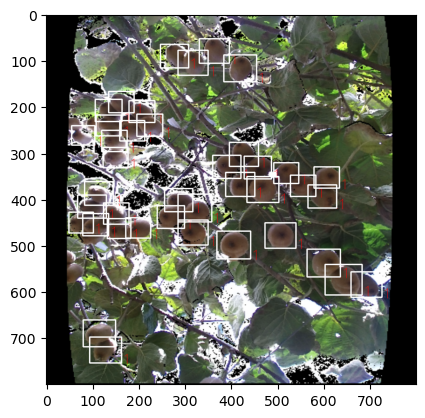

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


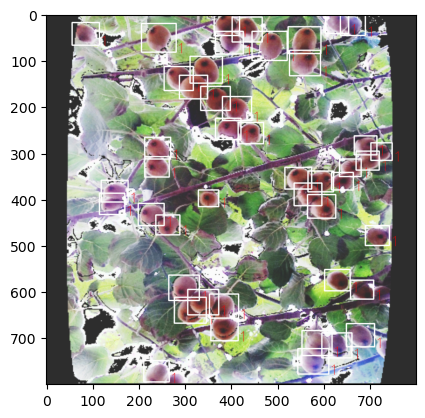

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


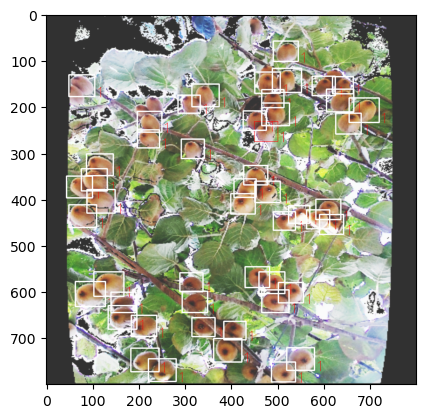

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


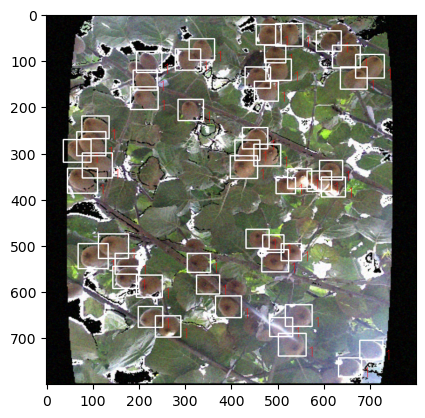

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


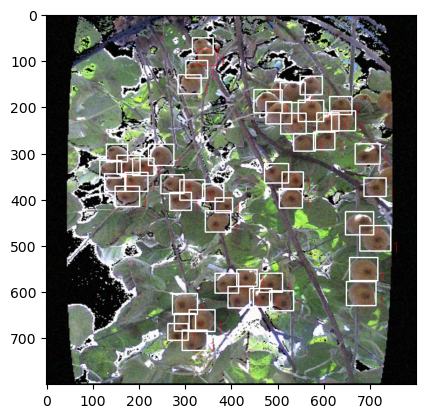

In [57]:
#display image with bbox (train)

#Yref_tr[:,0:2,0:2,:5] = [0.5,0.5,0.04,0.04,1]
#print("Yref_tr", Yref_tr[:,0:2,0:2,:5])

imgClone1 = np.zeros((S,S,3), dtype=int)
imgTr = np.zeros((S,S,5), dtype=int)
#dispImg = 5
labels = np.zeros((dispImg,S,S), dtype=int)
dx  = np.zeros((dispImg,S,S), dtype=int)
dy  = np.zeros((dispImg,S,S), dtype=int)
bboxNPtmp = np.zeros((5), dtype=int)
bboxNPdisp = np.zeros((5), dtype=int)
xmin = np.zeros((dispImg,S,S), dtype=int)
ymin = np.zeros((dispImg,S,S), dtype=int)
xmax = np.zeros((dispImg,S,S), dtype=int)
ymax = np.zeros((dispImg,S,S), dtype=int)
fontScale = 1
for im in range(dispImg):
    #labels = np.ones(tr_len[im], dtype=int)
    #labels_nk = np.zeros(nklen, dtype=int)
    #labels = np.append(labels_k, labels_nk, axis=0)
    #labels = labels

    #image to numpy array
    #imgClone = np.copy(numpy.array(SampleImg())
    imgClone1 = tr_ds[im,:,:,:]
    
    #print(imgClone)
    #print(type(imgClone))
    print(imgClone1.shape)

    #bboxNP[29][0]
    #imgClone

    
    

    #for i in range(klen+nklen):
    for i in range(S):
        for j in range(S):
            bboxNPtmp = Yref_tr[im,i,j,:]
            bboxNPdisp[0] = (bboxNPtmp[0]+i)*imsize/S
            bboxNPdisp[1] = (bboxNPtmp[1]+j)*imsize/S
            bboxNPdisp[2] = bboxNPtmp[2]*imsize
            bboxNPdisp[3] = bboxNPtmp[3]*imsize
            labels[im,i,j] = bboxNPtmp[4]
            
            #print("bboxNPdisp.shape: ", bboxNPdisp.shape)
            #print(FileNameLst_tr[im])
            #message = f"{im},{i},{j}"
            #print("im,i,j: ",message )
            #print("bboxNPdisp: ", bboxNPdisp)
            
            #bboxNP[:,0] = (bboxNP_tmp[:,0]*imsize/OrgWith)
            #print(i)
            #print(tr_len[im])
            xmin[im,i,j] = int(bboxNPdisp[0]-bboxNPdisp[2]/2) #.astype(int)
            ymin[im,i,j] = int(bboxNPdisp[1]-bboxNPdisp[3]/2)
            xmax[im,i,j] = int(bboxNPdisp[0]+bboxNPdisp[2]/2) #.astype(int)
            ymax[im,i,j] = int(bboxNPdisp[1]+bboxNPdisp[3]/2)
            dx[im,i,j] = int(bboxNPdisp[2])
            dy[im,i,j] = int(bboxNPdisp[3])
            #print("im: ", type(im))
            #print("i: ", type(i))
            #print("j: ", type(j))
            #dx[im,i,j] = xmax[im,i,j] - xmin[im,i,j]
            #dy[im,i,j] = ymax[im,i,j] - ymin[im,i,j]
            #print(f"(xmin, : ", xmin[im,i,j])
            #if i < tr_len[im]:
            imgTr = cv2.rectangle(imgClone1, (xmin[im,i,j], ymin[im,i,j], dx[im,i,j], dy[im,i,j]), color = (255,255,255), thickness = 2)
            #cv2.putText(imgClone1, str(labels[im,i,j]), (xmax[im,i,j], ymax[im,i,j]), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,255,255), thickness = 2)
            #else:
            #    cv2.rectangle(imgClone, (xmin, ymin, dx, dy), color = (255,0,0), thickness = 1)
                #cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)

    plt.imshow(imgTr)
    plt.show()

#print("imgClone1: ", imgClone1)
    
#print("xmin.mean: ", np.average(xmin)) 
#print("ymin.mean: ", np.average(ymin))
#print("xmin.min: ", np.min(xmin)) 
#print("ymin.min: ", np.min(ymin))
#print("xmin.max: ", np.max(xmin)) 
#print("ymin.max: ", np.max(ymin))

#print("xmax.mean: ", np.average(xmax)) 
#print("ymax.mean: ", np.average(ymax))
#print("xmax.min: ", np.min(xmax)) 
#print("ymax.min: ", np.min(ymax))
#print("xmax.max: ", np.max(xmax)) 
#print("ymax.max: ", np.max(ymax))

In [58]:
#del imgClone2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


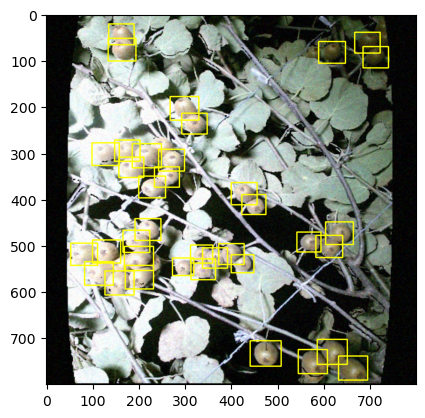

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


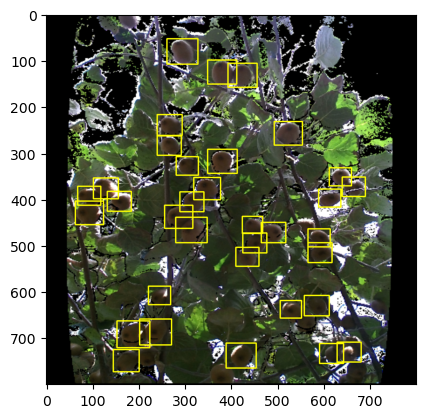

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


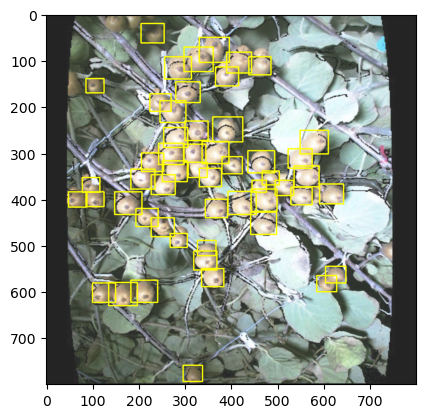

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


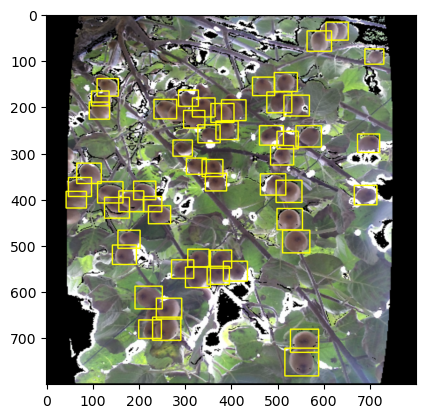

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(800, 800, 3)


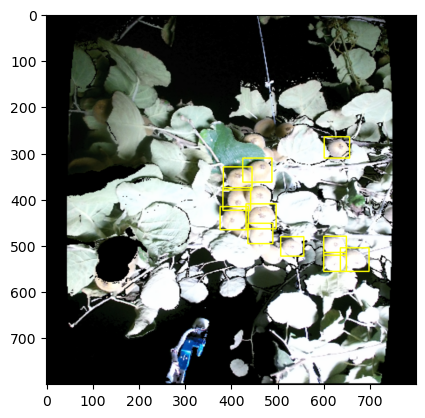

In [61]:
#display image with bbox (TEST)

imgClone2 = np.zeros((S,S,3), dtype=int)
imgTs = np.zeros((S,S,5), dtype=int)
#dispImg = min(5, numImgs)
labels = np.zeros((dispImg,S,S), dtype=int)
dx  = np.zeros((dispImg,S,S), dtype=int)
dy  = np.zeros((dispImg,S,S), dtype=int)
bboxNPtmp = np.zeros((5), dtype=int)
bboxNPdisp = np.zeros((5), dtype=int)
xmin = np.zeros((dispImg,S,S), dtype=int)
ymin = np.zeros((dispImg,S,S), dtype=int)
xmax = np.zeros((dispImg,S,S), dtype=int)
ymax = np.zeros((dispImg,S,S), dtype=int)
fontScale = 1
for im in range(dispImg):
    #labels = np.ones(tr_len[im], dtype=int)
    #labels_nk = np.zeros(nklen, dtype=int)
    #labels = np.append(labels_k, labels_nk, axis=0)
    #labels = labels

    #image to numpy array
    #imgClone = np.copy(numpy.array(SampleImg())
    imgClone2 = ts_ds[im,:,:,:]
    
    #print(imgClone)
    #print(type(imgClone))
    print(imgClone2.shape)

    #bboxNP[29][0]
    #imgClone

    
    

    #for i in range(klen+nklen):
    for i in range(S):
        for j in range(S):
            bboxNPtmp = Yref_ts[im,i,j,:]
            bboxNPdisp[0] = (bboxNPtmp[0]+i)*imsize/S
            bboxNPdisp[1] = (bboxNPtmp[1]+j)*imsize/S
            bboxNPdisp[2] = bboxNPtmp[2]*imsize
            bboxNPdisp[3] = bboxNPtmp[3]*imsize
            labels[im,i,j] = bboxNPtmp[4]
            
            #print("bboxNPdisp.shape: ", bboxNPdisp.shape)
            #print(FileNameLst_tr[im])
            #message = f"{im},{i},{j}"
            #print("im,i,j: ",message )
            #print("bboxNPdisp: ", bboxNPdisp)
            
            #bboxNP[:,0] = (bboxNP_tmp[:,0]*imsize/OrgWith)
            #print(i)
            #print(tr_len[im])
            xmin[im,i,j] = int(bboxNPdisp[0]-bboxNPdisp[2]/2) #.astype(int)
            ymin[im,i,j] = int(bboxNPdisp[1]-bboxNPdisp[3]/2)
            xmax[im,i,j] = int(bboxNPdisp[0]+bboxNPdisp[2]/2) #.astype(int)
            ymax[im,i,j] = int(bboxNPdisp[1]+bboxNPdisp[3]/2)
            dx[im,i,j] = int(bboxNPdisp[2])
            dy[im,i,j] = int(bboxNPdisp[3])
            #print("im: ", type(im))
            #print("i: ", type(i))
            #print("j: ", type(j))
            #dx[im,i,j] = xmax[im,i,j] - xmin[im,i,j]
            #dy[im,i,j] = ymax[im,i,j] - ymin[im,i,j]
            #print(f"(xmin, : ", xmin[im,i,j])
            #if i < tr_len[im]:
            imgTs = cv2.rectangle(imgClone2, (xmin[im,i,j], ymin[im,i,j], dx[im,i,j], dy[im,i,j]), color = (255,255,0), thickness = 2)
            #cv2.putText(imgClone1, str(labels[im,i,j]), (xmax[im,i,j], ymax[im,i,j]), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,255,255), thickness = 2)
            #else:
            #    cv2.rectangle(imgClone, (xmin, ymin, dx, dy), color = (255,0,0), thickness = 1)
                #cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)

    plt.imshow(imgTs)
    plt.show()


In [62]:
# Compile model
#-------------------

import tensorflow as tf
#import tensorflow_datasets as tfds
#import tensorflow_ranking as tfr

# (should be done *after* setting layers to non-trainable)
#endModel.compile(optimizer='rmsprop', loss='categorical_crossentropy')
opt = keras.optimizers.Adam(learning_rate=1.0)
YoloModel.compile(loss=yolo_loss ,optimizer=opt, metrics=["mse"]) #"BinaryCrossentropy()""])#["MeanSquaredError"])
#YoloModel.compile(loss=yolo_loss ,optimizer=opt, metrics=[keras.metrics.Precision(thresholds=0.1)]) #metrics=[tfr.keras.metrics.MeanAveragePrecisionMetric()])



In [65]:
print("Yref_tr", Yref_tr.shape)
print("tr_ds", tr_ds.shape)

Yref_tr (20, 25, 25, 5)
tr_ds (20, 800, 800, 3)


In [67]:
#### Preparing Training
#---------------------------

trTF_ds = tf.convert_to_tensor(tr_ds, dtype=tf.float32)
YrefTF_tr = tf.convert_to_tensor(Yref_tr, dtype=tf.float32)
print("tr_ds: ", tr_ds.shape)
print("Yref_tr: ", Yref_tr.shape)
print("YrefTF_tr: ", YrefTF_tr.shape)
tf.print("Bbox Tensor NumElements Nonzero: ", tf.math.count_nonzero(YrefTF_tr))
zero = tf.constant(0, dtype=tf.float32)
BBoxLoc = tf.not_equal(YrefTF_tr, zero) # Tensor same shape as Yref: 1: non zero; 0: zero
tf.print("BBoxLoc: ", BBoxLoc.shape) # All Locations in YrefTF_tr(NumImg,25,25,5) <> 0
BBoxIdxTF = tf.where(BBoxLoc) # Index of all BBoxLoc
BBoxIdx = BBoxIdxTF.numpy() # convertion to Numpy
BBoxNum = BBoxIdx.shape[0] # number of BBoxes
tf.print("BBoxNum: ", BBoxNum)
nb = range(0,BBoxNum,1) #(start,stop, step) # Range of indexes for example
#tf.print("BBoxIdx: ", BBoxIdx.shape) #index matrix shape
#tf.print("BBoxIdx[0:,:]: ", BBoxIdx[nb,:])
#tf.print("BBoxIdx[0:4,:]: ", BBoxIdx[nb,:])
#print("BBoxIdx: ", BBoxIdx)
BBIdx01=BBoxIdx[nb] #tolist()
BBIdx02=np.transpose(BBoxIdx[nb,:]) # first: all x0 index ... last all xn index
tf.print("BBIdx01: ", BBIdx01)
tf.print("BBIdx01[:4,2]: ", BBIdx01[:4,2])
tf.print("BBIdx01[0]: ", BBIdx01[0])
tf.print("BBIdx02: ", BBIdx02)
tf.print("BBIdx02[0]: ", BBIdx02[0])
idx = [0, 5, 9, 2]
#print("idx: ", type(idx))
#row, col = np.indices((1, 4))
#tmp = [BBIdx01[0],BBIdx01[1],BBIdx01[2],BBIdx01[3]]
# y[np.array([0, 2, 4]), np.array([0, 1, 2])]
#BBoxNew = Yref_tr[0, 5, 9, 2]
#BBoxNew2 = Yref_tr[idx[0],idx[1],idx[2],idx[3]]
#BBoxNew3 = Yref_tr[BBIdx01[0]]#,BBIdx01[1],BBIdx01[2],BBIdx01[3]]
BBoxNew4 = Yref_tr[BBIdx02[0],BBIdx02[1],BBIdx02[2],BBIdx02[3]]
#BBoxNew5 = Yref_tr[BBIdx01[0]]


#print("BBoxNew: ", BBoxNew)
#print("BBoxNew2: ", BBoxNew2)
#BBoxNew = Yref_tr[0, 5, 9, 2]
#print("BBoxNew3: ", BBoxNew3)
print("BBoxNew4: ", BBoxNew4.shape)
Ytest = YrefTF_tr.numpy() #YrefTF_tr
deltax = Ytest[BBIdx02[0],BBIdx02[1],BBIdx02[2],2]
deltay = Ytest[BBIdx02[0],BBIdx02[1],BBIdx02[2],3]
print("deltax: ", deltax.shape)
print("deltay: ", deltay.shape)
AreaXY = deltax * deltay
print("AreaXY: ", AreaXY.shape)
AreaSum = np.sum(AreaXY)
print("AreaSum.shape: ", AreaSum.shape)
print("AreaSum: ", AreaSum)
#BBoxNew = Yref_tr[BBoxIdx[nb,:]]
#BBoxNew = Yref_tr[0, 5, 9, 2]

#BBoxNew = tf.scatter_nd(indices, updates,
#BBoxNew = tf.gather_nd(YrefTF_tr, indices=BBoxInx)
#tf.print("BBoxNew: ", BBoxNew[nb])


#AnchorWhere = tf.not_equal(AnchorBox, zero)
#    AnchorInx = tf.where(AnchorWhere)
#    tf.print("AnchorWhere: ", AnchorWhere)
#    tf.print("AnchorInx: ", AnchorInx)


tr_ds:  (20, 800, 800, 3)
Yref_tr:  (20, 25, 25, 5)
YrefTF_tr:  (20, 25, 25, 5)
Bbox Tensor NumElements Nonzero:  4006
BBoxLoc:  TensorShape([20, 25, 25, 5])
BBoxNum:  4006
BBIdx01:  array([[ 0,  2,  8,  0],
       [ 0,  2,  8,  1],
       [ 0,  2,  8,  2],
       ...,
       [19, 22, 18,  2],
       [19, 22, 18,  3],
       [19, 22, 18,  4]], dtype=int64)
BBIdx01[:4,2]:  array([8, 8, 8, 8], dtype=int64)
BBIdx01[0]:  array([0, 2, 8, 0], dtype=int64)
BBIdx02:  array([[ 0,  0,  0, ..., 19, 19, 19],
       [ 2,  2,  2, ..., 22, 22, 22],
       [ 8,  8,  8, ..., 18, 18, 18],
       [ 0,  1,  2, ...,  2,  3,  4]], dtype=int64)
BBIdx02[0]:  array([ 0,  0,  0, ..., 19, 19, 19], dtype=int64)
BBoxNew4:  (4006,)
deltax:  (4006,)
deltay:  (4006,)
AreaXY:  (4006,)
AreaSum.shape:  ()
AreaSum:  17.708946


In [69]:
# defining a function to save the weights of best model


from tensorflow.keras.callbacks import ModelCheckpoint
checkpoint_filepath = '/tmp/ckpt/checkpoint.model.keras'
callbacks = [
    #keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
    ModelCheckpoint("{epoch:02d}-{val_loss:.4f}.keras", monitor='val_loss', verbose = 1, save_freq="epoch", mode='min')
]
#mcp_save = ModelCheckpoint('weight.hdf5', save_best_only=True, monitor='val_loss', mode='min')
#monitor='val_accuracy'
#monitor='val_loss'
#"weights-{epoch:03d}-{val_acc:.4f}.hdf5"
#trTF_ds = tf.convert_to_tensor(tr_ds, dtype=tf.float32)

#Yref_tr = np.zeros([numImgs,S,S,5])
#Yref_tr[:,0:2,0:2,:5] = [0.5,0.5,0.04,0.04,1]
#YrefTF_tr = tf.convert_to_tensor(Yref_tr, dtype=tf.float32)
#print("YrefTF_tr: ", YrefTF_tr.shape)
#Fit function

#Tiempo Ini
Tini = time.time()

#FIT
history = YoloModel.fit(x = trTF_ds,
          y = YrefTF_tr,
          #steps_per_epoch = int(len(X_train) // batch_size),
          batch_size = 2, #numImgs,
          epochs = 5,
          verbose = 1,
          #workers= 4,
          validation_split = val_split,
          callbacks = callbacks
          #validation_steps = int(len(X_val) // batch_size),
          # callbacks=[
          #    CustomLearningRateScheduler(lr_schedule),
          #    mcp_save
          #])
         )
Tfin = time.time()
print(history.params)
print("Tiempo Ejecucion FIT: ", Tfin-Tini)

Epoch 1/5
ImgLossF:  16.0
True number of Images in Loss Function:  2
tf.shape(y_pred)):  [2 25 25 5]
tf.reduce_sum(y_pred)):  9268.7334
tf.shape(y_true)):  [2 25 25 5]
label_box: [2 25 25 4]
response_mask: [2 25 25]
Sum label_box2 x label_box3:  0.405881256
tf.reduce_sum(AnchorBox): 96.337532
tf.shape(AnchorBox): [2 25 25 4]
Anchorbox Tensor NumElements Nonzero:  356
shape(AnchorInx):  [356 4]
AnchorInx[0]:  [0 2 8 0]
shape(AnchorData):  [356]
AnchorData:  [0.5 0.5 0.00744416891 ... 0.5 0.00744416891 0.075]
sum_AnchorData:  96.3375244
Calc Sum Areas of Anchorboxes:  0.1424
Sum Anchorbox2 x Anchorbox3:  0.0496898293
tf.shape(predict_box): [2 25 25 4]
tf.shape(predict_trust): [2 25 25]
tf.reduce_sum(predict_box): 7609.62207
tf.reduce_sum(predict_trust): 1659.11194
sum_predict_trust: 1659.11194
Sum predict_box2 x predict_box3:  2695.24268
SumAreas_pred:  1.72495539e+09
tf.shape(pred_mins)):  [2 25 25 2]
SumAreas_true:  259764
intersect_areas:  [[[0 0 0 ... 0 0 0]
  [0 0 0 ... 0 0 0]
  [0 

In [71]:
# list all data in history
print(history.history.keys())

dict_keys(['loss', 'mse', 'val_loss', 'val_mse'])


In [73]:
print(history.history["loss"])
print(history.history["mse"])
print(history.history["val_loss"])
print(history.history["val_mse"])

[99.81990051269531, 91.99803924560547, 89.97926330566406, 90.23967742919922, 90.01904296875]
[607352533286912.0, 1.7921650838208512e+16, 3.694700948724122e+16, 6.371048830690918e+16, 7.815965164385075e+16]
[80.00350189208984, 80.38063049316406, 80.19476318359375, 79.56633758544922, 79.25044250488281]
[2133087722930176.0, 1.2156256391266304e+16, 2.2865488908386304e+16, 3.003702558326784e+16, 3.404752860531917e+16]


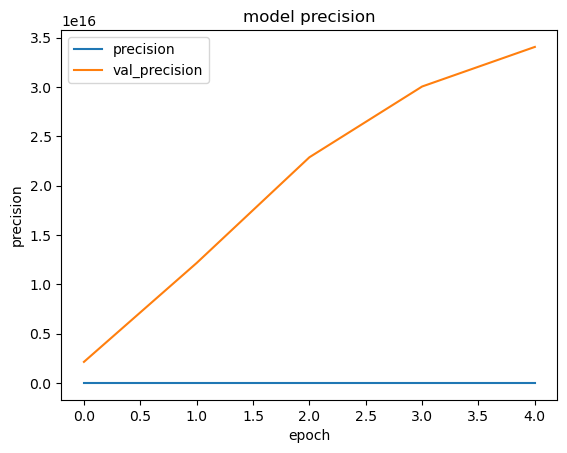

In [75]:
# summarize history for accuracy
plt.plot(history.history['loss'])
plt.plot(history.history['val_mse'])
plt.title('model precision')
plt.ylabel('precision')
plt.xlabel('epoch')
plt.legend(['precision', 'val_precision'], loc='upper left')
plt.show()

In [77]:
print("Yref_ts: ", Yref_ts.shape)
print("ts_ds: ", ts_ds.shape)

YrefTF_ts = tf.convert_to_tensor(Yref_ts, dtype=tf.float32)
tsTF_ds = tf.convert_to_tensor(ts_ds, dtype=tf.float32)

print("Test dataset evaluation")
YoloModel.evaluate(
    x=tsTF_ds,
    y= YrefTF_ts,
    batch_size=1,
    verbose=1,
    sample_weight=None,
    steps=None,
    callbacks=None,
    return_dict=False
)

Yref_ts:  (20, 25, 25, 5)
ts_ds:  (20, 800, 800, 3)
Test dataset evaluation
ImgLossF:  16.0
True number of Images in Loss Function:  1
tf.shape(y_pred)):  [1 25 25 5]
tf.reduce_sum(y_pred)):  3.6730513e+11
tf.shape(y_true)):  [1 25 25 5]
label_box: [1 25 25 4]
response_mask: [1 25 25]
Sum label_box2 x label_box3:  0.164606243
tf.reduce_sum(AnchorBox): 40.0504341
tf.shape(AnchorBox): [1 25 25 4]
Anchorbox Tensor NumElements Nonzero:  148
shape(AnchorInx):  [148 4]
AnchorInx[0]:  [0 2 16 0]
shape(AnchorData):  [148]
AnchorData:  [0.5 0.5 0.00744416891 ... 0.5 0.00744416891 0.075]
sum_AnchorData:  40.0504341
Calc Sum Areas of Anchorboxes:  0.0592
Sum Anchorbox2 x Anchorbox3:  0.0206575692
tf.shape(predict_box): [1 25 25 4]
tf.shape(predict_trust): [1 25 25]
tf.reduce_sum(predict_box): 3.67163212e+11
tf.reduce_sum(predict_trust): 141942960
sum_predict_trust: 141942960
Sum predict_box2 x predict_box3:  1.1595703e+20
SumAreas_pred:  7.42124966e+25
tf.shape(pred_mins)):  [1 25 25 2]
SumAreas_

KeyboardInterrupt: 

In [194]:
# Calling `save('my_model.keras')` creates a zip archive `my_model.keras`.
YoloModel.save("YoloModel_test01.keras")



In [196]:
# It can be used to reconstruct the model identically.
custom_objects = {'yolo_loss': yolo_loss} 
reconstructed_model = keras.models.load_model("YoloModel_test01.keras", custom_objects=custom_objects)


#custom_objects = {'custom_loss': custom_loss} 
#model = load_model('custom_model.h5', custom_objects=custom_objects)
# keras.saving.load_model("model.keras") #tf.keras.models

C:\Users\kikan\anaconda3\Lib\site-packages\keras\src\saving\saving_lib.py:713: UserWarning: Skipping variable loading for optimizer 'adam', because it has 14 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


In [200]:
print(type(trTF_ds))

#np.testing.assert_allclose( 
#    YoloModel.predict(x=trTF_ds, batch_size=1, verbose="auto", steps=None, callbacks=None), reconstructed_model.predict(trTF_ds)
#)

#YoloPredict = YoloModel.predict(x=trTF_ds, batch_size=1, verbose="auto", steps=None, callbacks=None)
#print(type(YoloPredict))
#print(YoloPredict.shape)

YoloPredict = reconstructed_model.predict(trTF_ds, batch_size=1, verbose=2, steps=None, callbacks=None)

<class 'tensorflow.python.framework.ops.EagerTensor'>
20/20 - 3835s - 192s/step


In [240]:
print(YoloPredict.shape)
print(type(YoloPredict))
print(YoloPredict[0,:,:,:])
print(sum(YoloPredict[0,:,:,:]))
print("sum(YoloPredict[0,:,:,0]): ",tf.reduce_sum(YoloPredict[0,:,:,0]))
print("sum(YoloPredict[0,:,:,1]): ",tf.reduce_sum(YoloPredict[0,:,:,1]))
print("sum(YoloPredict[0,:,:,2]): ",tf.reduce_sum(YoloPredict[0,:,:,2]))
print("sum(YoloPredict[0,:,:,3]): ",tf.reduce_sum(YoloPredict[0,:,:,3]))
print("sum(YoloPredict[0,:,:,4]): ",tf.reduce_sum(YoloPredict[0,:,:,4]))

(20, 25, 25, 5)
<class 'numpy.ndarray'>
[[[0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  ...
  [0.0000 0.0001 0.0000 0.0001 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0009 0.0000 0.0002 0.0000]]

 [[0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0003 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  ...
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]]

 [[0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0003 0.0000]
  ...
  [0.0000 0.0002 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0007 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]]

 ...

 [[0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  ...
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0000 0.0000 0.0000 0.0000 0.0000]
  [0.0002 0.0000 0.0002 0.0

In [236]:
#del imgClone3

(20, 25, 25, 5)
<class 'numpy.ndarray'>
(800, 800, 3)


TypeError: Invalid shape (25, 25, 5) for image data

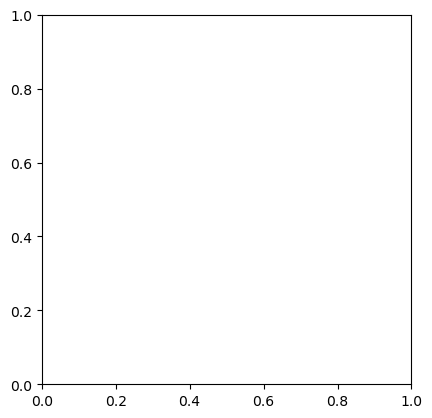

In [242]:
#recalculate bbox coordinates of predictions and ployt on images

#YoloPredictTF = tf.convert_to_tensor(YoloPredict, dtype=tf.float32)
#YoloPredict1 = Yref_ts
YoloPredict1 = YoloPredict
print(YoloPredict1.shape)
print(type(YoloPredict1))
#print(YoloPredict)

predImgs = 2
imgClone3 = np.zeros((S,S,5), dtype=int)
imgPr = np.zeros((S,S,5), dtype=int)

labels = np.zeros((predImgs,S,S), dtype=int)
xc = np.zeros((predImgs,S,S), dtype=int)
yc = np.zeros((predImgs,S,S), dtype=int)
w = np.zeros((predImgs,S,S), dtype=int)
h = np.zeros((predImgs,S,S), dtype=int)
x0 = np.zeros((predImgs,S,S), dtype=int)
y0 = np.zeros((predImgs,S,S), dtype=int)
x1 = np.zeros((predImgs,S,S), dtype=int)
y1 = np.zeros((predImgs,S,S), dtype=int)
i = 0
cx = 0
cy = 0
#labels = np.ones(predImgs, dtype=int)
fontScale = 1


bboxNPtmp = np.zeros((5), dtype=int)
bboxNPdisp = np.zeros((5), dtype=int)

for i in range(predImgs):
    imgClone3 = ts_ds[i,:,:,:]
    print(imgClone3.shape)
    for cx in range (S):
        for cy in range (S):
            # Recalculate coordinates of rectangls
            xc[i,cx,cy] = (YoloPredict1[i,cx,cy,0] + cx)*imsize/S
            yc[i,cx,cy] = (YoloPredict1[i,cx,cy,1] + cy)*imsize/S
            w[i,cx,cy] = (YoloPredict1[i,cx,cy,2]+(1/25))*imsize
            h[i,cx,cy] = (YoloPredict1[i,cx,cy,3]+(1/25))*imsize
            labels[i,cx,cy] = YoloPredict1[i,cx,cy,4]
            
            dx1 = int(w[i,cx,cy])
            dy1 = int(h[i,cx,cy])
            x0[i,cx,cy] = int(xc[i,cx,cy]-w[i,cx,cy]/2)
            y0[i,cx,cy] = int(yc[i,cx,cy]-h[i,cx,cy]/2)
            x1[i,cx,cy] = int(xc[i,cx,cy]+w[i,cx,cy]/2)
            y1[i,cx,cy] = int(yc[i,cx,cy]+h[i,cx,cy]/2)
            xmin1 = int(x0[i,cx,cy])#.astype(int)
            ymin1 = int(y0[i,cx,cy])
            xmax1 = int(x1[i,cx,cy])
            ymax1 = int(y1[i,cx,cy])
            if labels[i,cx,cy] > 0.01:
                print(f"xc: {xc[i,cx,cy]}; yc: {yc[i,cx,cy]}; dx: {w[i,cx,cy]}; dy: {h[i,cx,cy]}; labels: {labels[i,cx,cy]}")

                # Draw rectangles in image
                #if i < ts_len[i]:
                imgPr = cv2.rectangle(imgClone3, (xmin1, ymin1, dx1, dy1), color = (255,255,255), thickness = 1)
                    #cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)
                #else:
                    #cv2.rectangle(imgClone, (xmin, ymin, dx, dy), color = (255,0,0), thickness = 10)
                    #cv2.putText(imgClone, str(int(labels[i])), (xmax, ymax), cv2.FONT_HERSHEY_SIMPLEX, fontScale, (255,0,0), thickness = 1)

    #type(str(int(labels[i])))    
    #cv2.rectangle(imgClone, (0, 0, 50, 50), color = (0,255,0), thickness = 3)

    plt.imshow(imgPr)
    plt.show()

    
    
    
    


    

In [ ]:
# -----------------------------------------
# Test loss function
# -----------------------------------------

# Printing elements of array up to 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})
print("Yref_tr: ",Yref_tr.shape)
Yref_tr = np.zeros([numImgs,S,S,5])
Yref_tr[:,0:2,0:2,:5] = [0.5,0.5,0.04,0.04,1]
print("Yref_tr[0,0,0,:5]: ",Yref_tr[0,0,0,:5])
print("Sum Yref_tr[0,0:2,0:2,:5]: ",np.sum(Yref_tr[0,0:2,0:2,:5]))
#print(type(Yref_tr))
YrefTF_tr = tf.convert_to_tensor(Yref_tr, dtype=tf.float32)
#sumaY = tf.keras.backend.sum(YrefTF_tr,axis = 2, keepdims=False)
#print("sumaY: ", sumaY.take(10))
#print("YrefTF_tr: ", YrefTF_tr)
#print("Yref_tr Tensor: ", YrefTF_tr.shape)
#print(type(YrefTF_tr))
#y_predicted = YoloOut
y_predicted = np.zeros((numImgs,25,25,5))

y_predicted[:,0:2,0:2,:5]=[0.5,0.5,0.01,0.01,1]
#y_predicted[:,:,:,1]=0.5
#y_predicted[:,:,:,2]=0.01
#y_predicted[:,:,:,3]=0.01
#y_predicted[:,:,:,4]=1.0
y_predicted = tf.convert_to_tensor(y_predicted, dtype=tf.float32)
#y_predicted = tf.cast(tf.float32)
#y_predicted= y_predicted.astype(np.int16)
print("y_predicted: ", y_predicted[0,0:3,0:3,:5])
print(type(y_predicted))
loss_np = yolo_loss(YrefTF_tr, y_predicted)
#print("loss_np: ", loss_np)